# Quality Control and Normalization for Sequence-based data analysis

Author: Franziska Niemeyer

Modified from: George Gavriilidis

Contact: franziska.niemeyer@helsinki.fi

**Topics in this notebook:**
1. Quality control
2. Normalization
3. Dimensionality reduction & clustering
4. Gene selection

In [1]:
import os
import spatialdata as sd
import spatialdata_plot as sdp
import scanpy as sc
try:
    # Fix for known issue with squidpy - scanpy version incompatability
    from scanpy.plotting import _utils as sc_pl_utils
    if not hasattr(sc_pl_utils, "_set_default_colors_for_categorical_obs") and hasattr(
        sc_pl_utils, "set_default_colors_for_categorical_obs"
    ):
        sc_pl_utils._set_default_colors_for_categorical_obs = sc_pl_utils.set_default_colors_for_categorical_obs
except Exception:
    pass
import squidpy as sq
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

from matplotlib.colors import ListedColormap
from spatialdata_io import visium, visium_hd, xenium
from scipy.sparse import issparse

/opt/conda/envs/p10_qc_normalization/lib/python3.12/site-packages/dask/dataframe/__init__.py:31: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  warnings.warn(
/opt/conda/envs/p10_qc_normalization/lib/python3.12/site-packages/xarray_schema/__init__.py:1: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution
/opt/conda/envs/p10_qc_normalization/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  

In [2]:
sc.settings.verbosity = 3

# Load Visium dataset

We will be using a Visium v1 dataset from fresh frozen mouse brain tissue ([See here for more information about the dataset](https://www.10xgenomics.com/datasets/mouse-brain-section-coronal-1-standard-1-0-0))

In [3]:
# Define the path to the organized Visium data directory
visium_data_path = "/home/jovyan/shared/day-03/data/visium_v1_adult_mouse_brain"

# Don't download in Noppe
# os.makedirs(visium_data_path, exist_ok=True)
# !wget -O {visium_data_path}/V1_Adult_Mouse_Brain_raw_feature_bc_matrix.h5 https://cf.10xgenomics.com/samples/spatial-exp/1.0.0/V1_Adult_Mouse_Brain/V1_Adult_Mouse_Brain_raw_feature_bc_matrix.h5
# !wget -O {visium_data_path}/V1_Adult_Mouse_Brain_spatial.tar.gz https://cf.10xgenomics.com/samples/spatial-exp/1.0.0/V1_Adult_Mouse_Brain/V1_Adult_Mouse_Brain_spatial.tar.gz 
# !tar -xzf {visium_data_path}/V1_Adult_Mouse_Brain_spatial.tar.gz

# Read the Visium data into an AnnData object
adata = sc.read_visium(visium_data_path, count_file="V1_Adult_Mouse_Brain_raw_feature_bc_matrix.h5")

# Display basic information about the AnnData object
print(adata)

reading /home/jovyan/shared/day-03/data/visium_v1_adult_mouse_brain/V1_Adult_Mouse_Brain_raw_feature_bc_matrix.h5


/tmp/ipykernel_86/787698899.py:11: FutureWarning: Use `squidpy.read.visium` instead.
  adata = sc.read_visium(visium_data_path, count_file="V1_Adult_Mouse_Brain_raw_feature_bc_matrix.h5")


 (0:00:00)
AnnData object with n_obs × n_vars = 4992 × 31053
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'


/opt/conda/envs/p10_qc_normalization/lib/python3.12/site-packages/anndata/_core/anndata.py:1813: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")


In [4]:
# Make variable names unique
adata.var_names_make_unique()

# Spot-level Quality Control

In [5]:
# An R implementation of these analytical steps can pe found here: https://bookdown.org/sjcockell/ismb-tutorial-2023/

## Introduction to Spot-Level Quality Control (sQC)

Quality control (QC) is essential for analyzing high-throughput molecular biology data. Removing noise and low-quality data from complex datasets enhances the reliability of downstream analyses. Spatial transcriptomics (STx) is no exception, with QC typically performed at two main levels: **spot-level** and **gene-level**.

### Spot-Level Quality Control (sQC)

Spot-level QC eliminates low-quality spots prior to analysis. These low-quality spots can result from issues during library preparation or experimental procedures, such as:
- **High percentage of dead cells** due to cell damage during library preparation.
- **Low mRNA capture efficiency** caused by ineffective reverse transcription or PCR amplification.

Keeping low-quality spots can introduce noise and compromise the accuracy of downstream analyses.

### Characteristics of Low-Quality Spots

Low-quality spots are identified using criteria similar to those used in cell-level QC for single-cell RNA sequencing (scRNA-seq) data:
- **Library size**: Total UMI counts per spot may vary due to sequencing or the number of cells in the spot.
- **Number of expressed genes**: The number of genes with non-zero UMI counts per spot.
- **Proportion of mitochondrial reads**: A high proportion indicates potential cell damage.

#### Key Indicators:
1. **Low Library Size / Expressed Features**:
   - Reflects poor mRNA capture rates due to cell damage or low reaction efficiency.
2. **High Mitochondrial Proportion**:
   - Indicates cell damage, e.g., partial lysis, leading to cytoplasmic mRNA leakage and a higher concentration of relatively protected mitochondrial mRNAs.

### Relevance of scRNA-seq QC Metrics in STx

The use of scRNA-seq QC metrics in STx data is based on the similarity between datasets. When spatial information is ignored, each spot can be treated as a single cell. However, STx spots differ from scRNA-seq cells because they may contain zero, one, or multiple cells, leading to distinct distributions for high-quality spots compared to high-quality cells in scRNA-seq. One must **be careful not to filter blindly**. Different tissue compartments might simply have differently high or low overall expression, RNA permeability, or mitochondrial RNA expression. There are methods to account for these effects, but we won't go into detail on them in this tutorial, but refer you to the references at the end of this notebook.

## Plot tissue map

Initially, we will try to get a sense of the data by plotting the high-resolution image with spatial coordinates overlayed.

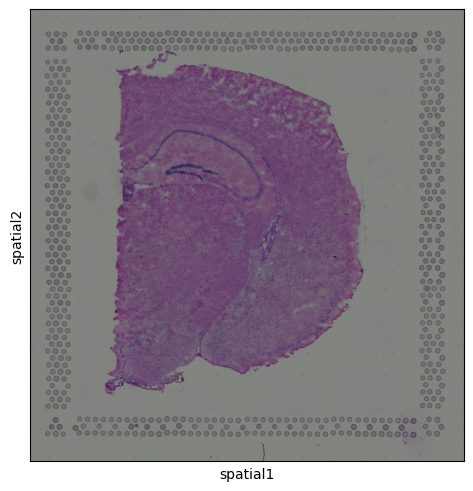

In [6]:
# Plot spatial coordinates without annotations
sq.pl.spatial_scatter(adata, color=None)

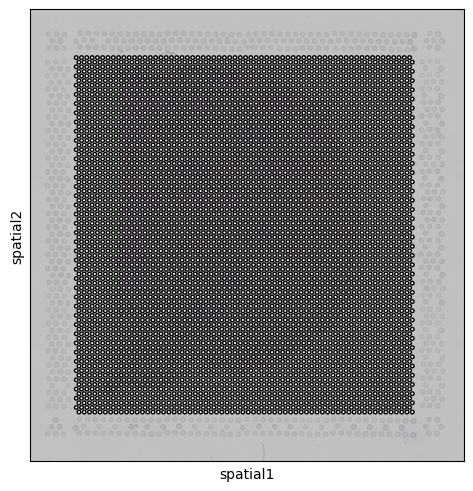

In [7]:
# Overlay spatial coordinates on the tissue image
sq.pl.spatial_scatter(
    adata,
    color=None,       # No color (default spots)
    size=.5,          # Adjust spot size
    alpha=.2,         # Adjust transparency of the spots
    outline=True,     # Show spot outline
    img_alpha=.5
)

## Calculating QC metrics

As of now, the dataset contains both on- and off-tissue spots. For any future analysis though, we are only interested in the on-tissue spots. Therefore, before we run any calculations we want to remove the off-tissue spots.

In [8]:
# Display dataset dimensions before filtering
print(f"Dataset dimensions before filtering: {adata.shape}")

# Filter to include only on-tissue spots
adata = adata[adata.obs['in_tissue'] == 1].copy()

# Display dataset dimensions after filtering
print(f"Dataset dimensions after filtering: {adata.shape}")

Dataset dimensions before filtering: (4992, 31053)
Dataset dimensions after filtering: (2698, 31053)


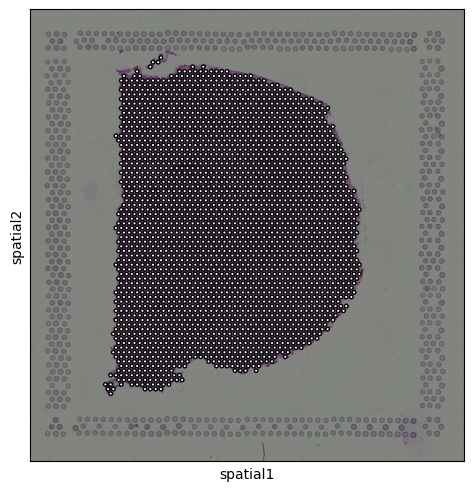

In [9]:
sq.pl.spatial_scatter(
    adata,
    color=None,       # No color (default spots)
    size=.5,          # Adjust spot size
    alpha=.2,         # Adjust transparency of the spots
    outline=True,     # Show spot outline
)

In [10]:
# Print the first 20 gene names in your dataset
print("First 20 gene names in the dataset:")
print(adata.var_names[:20].tolist())

# Detect mitochondrial genes using alternative prefixes
mito_genes_alt = adata.var_names.str.contains("(^MT-)|(^mt-)|(^mt\\-)", regex=True)
print(f"Number of mitochondrial genes detected: {mito_genes_alt.sum()}")

# Extract and print the names of mitochondrial genes
mito_genes_list = adata.var_names[mito_genes_alt]
print("Mitochondrial genes detected:")
print(mito_genes_list.tolist())

First 20 gene names in the dataset:
['Xkr4', 'Gm1992', 'Gm37381', 'Rp1', 'Sox17', 'Gm37323', 'Mrpl15', 'Lypla1', 'Gm37988', 'Tcea1', 'Rgs20', 'Gm16041', 'Atp6v1h', 'Oprk1', 'Npbwr1', 'Rb1cc1', '4732440D04Rik', 'Alkal1', 'St18', 'Pcmtd1']
Number of mitochondrial genes detected: 13
Mitochondrial genes detected:
['mt-Nd1', 'mt-Nd2', 'mt-Co1', 'mt-Co2', 'mt-Atp8', 'mt-Atp6', 'mt-Co3', 'mt-Nd3', 'mt-Nd4l', 'mt-Nd4', 'mt-Nd5', 'mt-Nd6', 'mt-Cytb']


/tmp/ipykernel_86/2354530812.py:6: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  mito_genes_alt = adata.var_names.str.contains("(^MT-)|(^mt-)|(^mt\\-)", regex=True)


Now lets find genes with the highest expression across the whole dataset. We use the scanpy function pl.highest_expr_genes to understand which genes dominate the transcriptional landscape. This helps us quickly identify genes with the highest abundance, which are often either essential housekeeping genes or specific markers that define particular cell types. Examining the top expressed genes serves both technical and biological purposes: it allows us to check for any potential technical artifacts (e.g., genes with unusually high background expression) and offers biological insight by highlighting key genes likely involved in core cellular functions or distinguishing cell types.

In [11]:
n = 10
adata.var['mean_expression'] = np.ravel(adata.X.mean(0))
x = pd.DataFrame(adata.var.nlargest(n, 'mean_expression')['mean_expression'])
x

,mean_expression
Bc1,1889.733765
mt-Co3,848.705994
mt-Atp6,807.873047
Gm42418,790.272034
mt-Co1,706.934143
mt-Co2,645.548462
mt-Cytb,404.213379
mt-Nd4,340.074493
mt-Nd1,338.398743
mt-Nd2,239.262100


normalizing counts per cell
    finished (0:00:02)


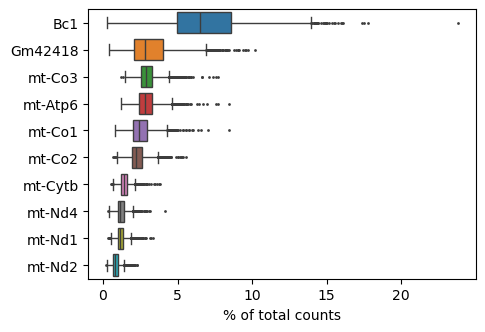

In [12]:
sc.pl.highest_expr_genes(adata, n_top=n)

We can see that mitochondrial RNAs make up a huge portion of the total RNA counts. Let's quantify this on the spot-level and leverage the mitochondrial RNA content of a given spot as a quality metric for dying cells.

In [13]:
# Adjust for mouse mitochondrial genes (prefix: "MT-" or "mt-")
adata.var['mt'] = adata.var_names.str.startswith("mt-")

# Recalculate mitochondrial QC metrics
sc.pp.calculate_qc_metrics(
    adata,
    qc_vars=['mt'],    # Use the updated 'mt' column
    percent_top=None,  # Skip top expressed genes for now
    inplace=True       # Add results directly to adata.obs
)

# Inspect recalculated metrics
print(adata.obs[['total_counts', 'n_genes_by_counts', 'pct_counts_mt']].head())

                    total_counts  n_genes_by_counts  pct_counts_mt
AAACAAGTATCTCCCA-1       19340.0               4928      19.943123
AAACAATCTACTAGCA-1       13750.0               3448      23.760000
AAACACCAATAACTGC-1       32710.0               6022      15.010699
AAACAGAGCGACTCCT-1       15909.0               4311      20.554403
AAACCGGGTAGGTACC-1       31856.0               5787      21.010170


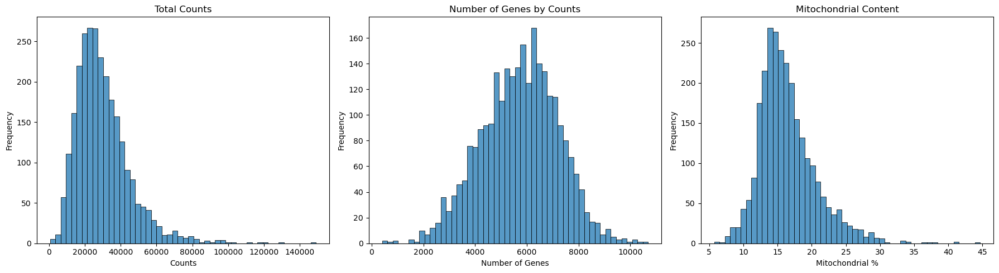

In [14]:
# Plot histograms for recalculated QC metrics
fig, axs = plt.subplots(1, 3, figsize=(18, 5))

# Total counts
sns.histplot(adata.obs["total_counts"], kde=False, bins=50, ax=axs[0])
axs[0].set_title("Total Counts")
axs[0].set_xlabel("Counts")
axs[0].set_ylabel("Frequency")

# Number of genes by counts
sns.histplot(adata.obs["n_genes_by_counts"], kde=False, bins=50, ax=axs[1])
axs[1].set_title("Number of Genes by Counts")
axs[1].set_xlabel("Number of Genes")
axs[1].set_ylabel("Frequency")

# Mitochondrial content
sns.histplot(adata.obs["pct_counts_mt"], kde=False, bins=50, ax=axs[2])
axs[2].set_title("Mitochondrial Content")
axs[2].set_xlabel("Mitochondrial %")
axs[2].set_ylabel("Frequency")

# Adjust layout for better visualization
plt.tight_layout()
plt.show()

This is an overview of what is happening to our dataset let's focus on each metric below.

## Library size

The library size is the number of UMI counts in each spot.
To get a glimpse of how library size changes spatially:

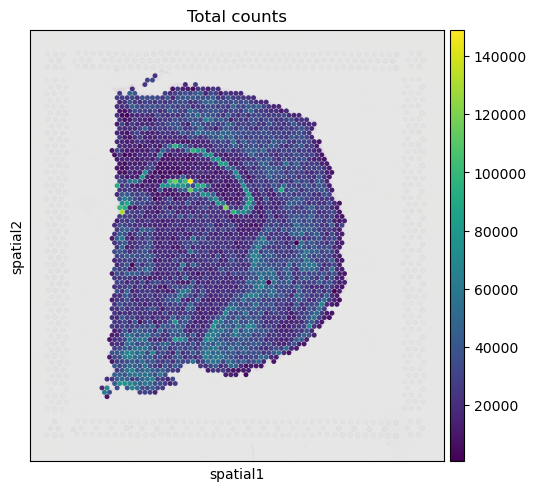

In [15]:
sq.pl.spatial_scatter(
    adata,
    color=["total_counts"],
    title=["Total counts"],
    size=1.5,
    alpha=1,
    img_alpha=.2
)

We can clearly see that certain areas of the tissue have much higher counts that others. The reason for this is that the cell density varies vastly, with the pyramidal layers of the Hippocampus (gray matter) for example having a very high cell density compared to the low cell density in the areas surrounding the pyramidal layers (white matter). Areas of high cell density will naturally have higher RNA counts and vice versa. We should thus be conservative with our filtering based on the library size, and consider accounting for this problem during normalization. If we were to perform differential gene expression analysis, we could take this phenomenon into account by adding the cell density as a covariate to our analysis, but we would have to perform a cell segmentation for this first, which will be covered in the next practical. For now, we will just acknowledge the fact that we have a highly variable library size distribution.

We can plot a histogram of the library sizes across spots.

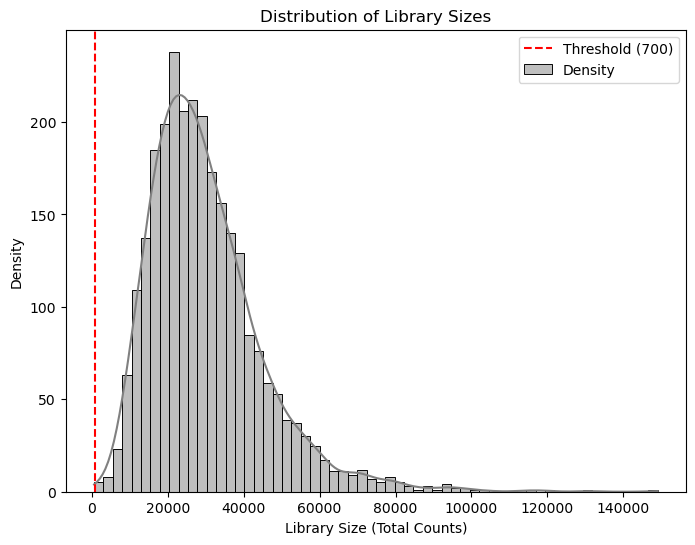

In [16]:
# Plot histogram and density of library sizes
plt.figure(figsize=(8, 6))
sns.histplot(adata.obs['total_counts'], kde=True, color='gray', label='Density')
plt.axvline(x=700, color='red', linestyle='--', label='Threshold (700)')
plt.title('Distribution of Library Sizes')
plt.xlabel('Library Size (Total Counts)')
plt.ylabel('Density')
plt.legend()
plt.show()

<div style="
  padding: 12px 14px;
  border-left: 5px solid #7E57C2;
  background: rgba(126,87,194,0.08);
  border-radius: 10px;
  margin: 10px 0;
">
  <div style="font-weight: 700; margin-bottom: 6px;">🪞 Reflection Point</div>
  <div>
    Why would we even want to filter out spots with low library size?
  </div>

  <details style="
    margin-top: 10px;
    padding: 8px 10px;
    background: rgba(0,0,0,0.05);
    border-radius: 8px;
  ">
    <summary style="cursor: pointer; font-weight: 600;">
      🔎 Reveal answer
    </summary>
    <div style="margin-top: 8px;">
        Low counts often indicate:
        <ul>
            <li>
                Technical capture failure (e.g. poor permeabilization, tissue detachment, edge-of-tissue artifacts, inefficient reverse transcription, etc.)
            </li>
            <li>
                Increased technical noise (unstable gene expression estimates due to low sample size within the spot)
            </li>
        </ul>
        These artifacts can bias our analyses, for example exaggerate log-normalization effects, and create artificial variance that is going to be picked up by our dimensionality reduction.
    </div>
  </details>
</div>

In [17]:
# Apply a threshold for low library size (e.g., 1000 UMI counts)
lib_size_threshold = 1000
adata.obs['qc_lib_size'] = adata.obs['total_counts'] < lib_size_threshold

# Count the number of spots flagged as low library size
low_library_count = adata.obs['qc_lib_size'].sum()
print(f"Number of spots with low library size: {low_library_count}")

# Make it categorical with readable labels
adata.obs["qc_lib_size_plot"] = (
    adata.obs["qc_lib_size"]
    .map({True: "low", False: "ok"})
    .astype("category")
)

Number of spots with low library size: 2


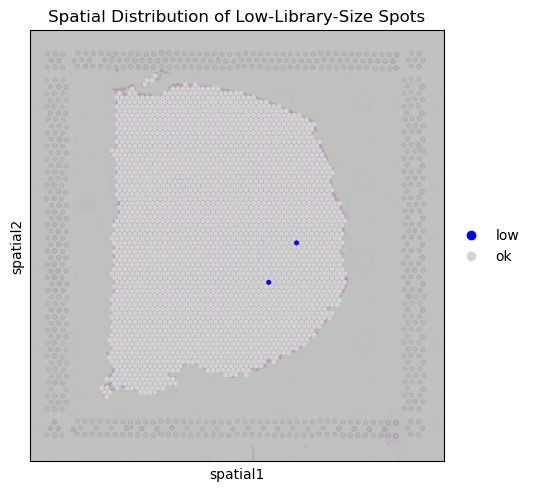

In [18]:
# Visualize spots flagged for low library size
sq.pl.spatial_scatter(
    adata,
    color=["qc_lib_size_plot"],
    size=1.5,
    title="Spatial Distribution of Low-Library-Size Spots",
    img_alpha=.5,
    palette=ListedColormap(["blue", "lightgray"])
)

We need to keep in mind here that the threshold is, to an extent, arbitrary. It is therefore important to look at the number of spots that are left out of the dataset by this choice of cut-off value, and also have a look at their putative spatial patterns. If we filtered out spots with biological relevance, then we should observe some patterns on the tissue map that correlate with some of the known biological structures of the tissue. If we do observe such a phenomenon, we have probably set our threshold too high (i.e. not permissive enough).

<div style="
  padding: 12px 14px;
  border-left: 5px solid #7E57C2;
  background: rgba(126,87,194,0.08);
  border-radius: 10px;
  margin: 10px 0;
">
  <div style="font-weight: 700; margin-bottom: 6px;">🪞 Reflection Point</div>
  <div>
    Do you see any spatial patterning while we are thresholding? What would spatial patterning mean for our QC thresholding?
  </div>

  <details style="
    margin-top: 10px;
    padding: 8px 10px;
    background: rgba(0,0,0,0.05);
    border-radius: 8px;
  ">
    <summary style="cursor: pointer; font-weight: 600;">
      🔎 Reveal answer
    </summary>
    <div style="margin-top: 8px;">
        Spatial patterning here means that the spots/cells you’re about to remove (e.g., high % mito, low counts, high ribosomal, low genes) are not randomly scattered, but cluster in particular tissue regions (edges, folds/tears, necrotic core, empty areas, high-immune regions, lumen, etc.).

If the “bad” spots cluster in obvious technical regions (off-tissue, tears, border effects, poor permeabilization zones), then a stricter threshold is usually OK because you’re mostly removing artifacts.

If the “bad” spots cluster in biologically meaningful regions (hypoxic tumor core, inflamed stroma, metabolically active areas), then aggressive thresholding can erase real biology.
    </div>
  </details>
</div>

## Number of expressed genes

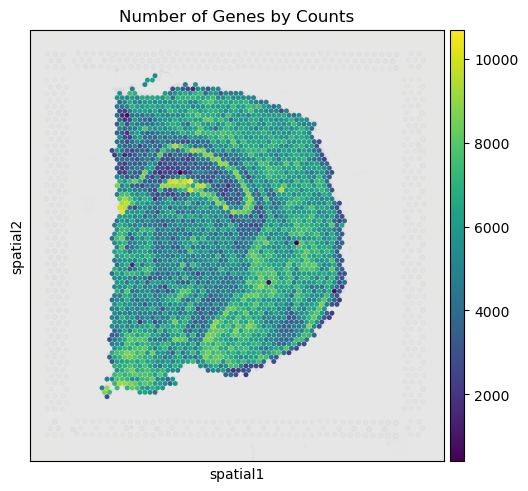

In [19]:
sq.pl.spatial_scatter(
    adata,
    color=["n_genes_by_counts"],
    title=["Number of Genes by Counts"],
    size=1.5,
    alpha=1,
    img_alpha=.2
)

As we did with the library sizes, we can plot a histogram of the number of expressed genes across spots. A gene is “expressed” in a spot if it has at least one count in it.

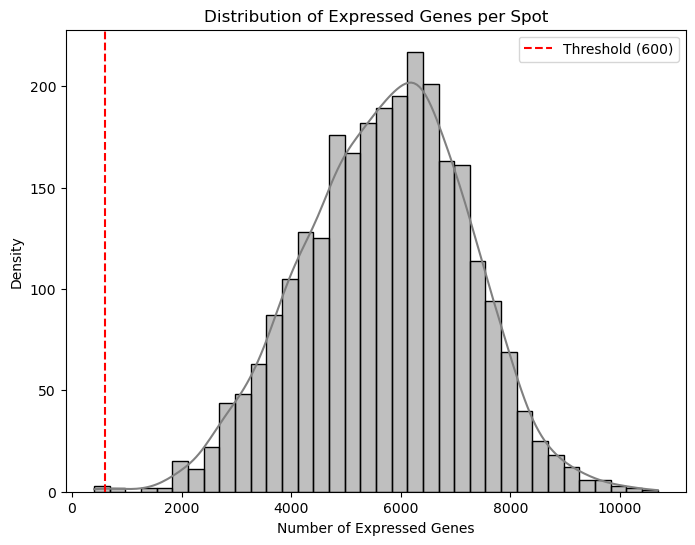

In [20]:
# Plot the distribution of expressed genes
plt.figure(figsize=(8, 6))
sns.histplot(adata.obs['n_genes_by_counts'], kde=True, color='gray')
plt.title('Distribution of Expressed Genes per Spot')
plt.xlabel('Number of Expressed Genes')
plt.ylabel('Density')
plt.axvline(x=600, color='red', linestyle='--', label='Threshold (600)')
plt.legend()
plt.show()

Finally, again as before, we apply the chosen threshold to flag spots with (in this case) fewer than 600 expressed genes.

In [21]:
# Apply the threshold for the number of expressed genes
threshold_expressed_genes = 600
adata.obs['qc_expressed_genes'] = adata.obs['n_genes_by_counts'] < threshold_expressed_genes

# Count the number of spots flagged as low-quality based on expressed genes
low_quality_genes_count = adata.obs['qc_expressed_genes'].sum()
print(f"Number of spots with fewer than {threshold_expressed_genes} expressed genes: {low_quality_genes_count}")

# Make it categorical with readable labels
adata.obs["qc_expressed_genes_plot"] = (
    adata.obs["qc_expressed_genes"]
    .map({True: "low", False: "ok"})
    .astype("category")
)

Number of spots with fewer than 600 expressed genes: 2


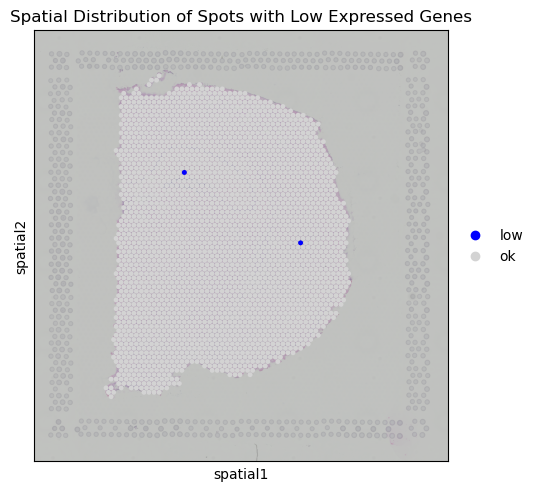

In [22]:
# Visualize spots flagged for low expressed genes
sq.pl.spatial_scatter(
    adata,
    color='qc_expressed_genes_plot',
    size=1.5,
    title='Spatial Distribution of Spots with Low Expressed Genes',
    img_alpha=.5,
    palette=ListedColormap(["blue", "lightgray"])
)

<div style="
  padding: 12px 14px;
  border-left: 5px solid #1aa6a6;
  background: rgba(26,166,166,0.08);
  border-radius: 10px;
  margin: 10px 0;
">
  <div style="font-weight: 700; margin-bottom: 6px;">👾 Exercise</div>
  <div>
    Adjust the threshold to test ober-enthusiastic filtering. Do you see any patterns emerge?
  </div>
</div>

In [23]:
# Apply the threshold for the number of expressed genes
threshold_expressed_genes_high = 5000
adata.obs['qc_expressed_genes_high'] = adata.obs['n_genes_by_counts'] < threshold_expressed_genes_high

# Count the number of spots flagged as low-quality based on expressed genes
low_quality_genes_count = adata.obs['qc_expressed_genes_high'].sum()
print(f"Number of spots with fewer than {threshold_expressed_genes_high} expressed genes: {low_quality_genes_count}")

# Make it categorical with readable labels
adata.obs["qc_expressed_genes_high_plot"] = (
    adata.obs["qc_expressed_genes_high"]
    .map({True: "low", False: "ok"})
    .astype("category")
)

Number of spots with fewer than 5000 expressed genes: 844


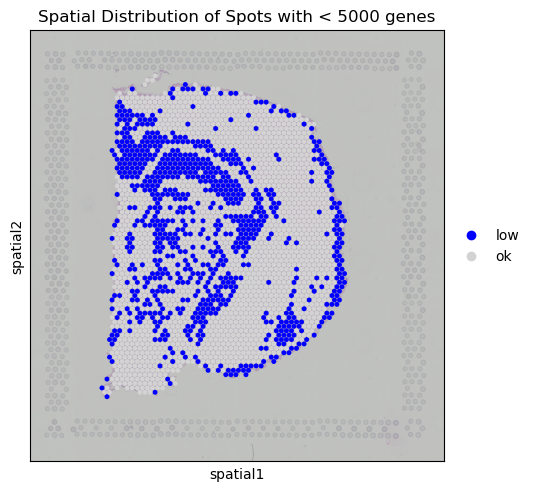

In [24]:
# Visualize spots flagged for low expressed genes
sq.pl.spatial_scatter(
    adata,
    color='qc_expressed_genes_high_plot',
    size=1.5,
    title=f'Spatial Distribution of Spots with < {threshold_expressed_genes_high} genes',
    img_alpha=.5,
    palette=ListedColormap(["blue", "lightgray"])
)

## Percentage of mitochondrial expression

As we briefly touched on at the beginning, a high proportion of mitochondrial reads indicates low cell quality, probably due to cell damage.

We calculated this data earlier on in this session, and can now investigate the percentage of mitochondrial expression across spots.

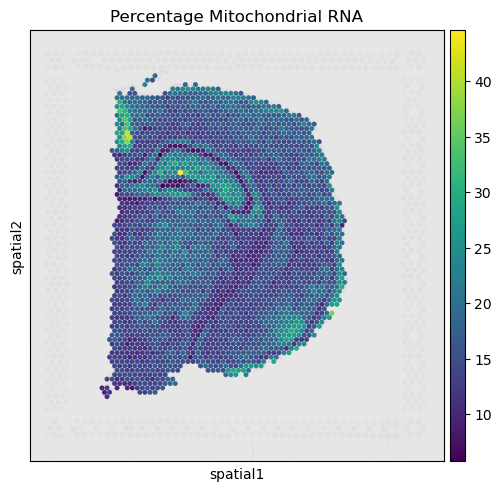

In [25]:
sq.pl.spatial_scatter(
    adata,
    color=["pct_counts_mt"],
    title=["Percentage Mitochondrial RNA"],
    size=1.5,
    alpha=1,
    img_alpha=.2
)

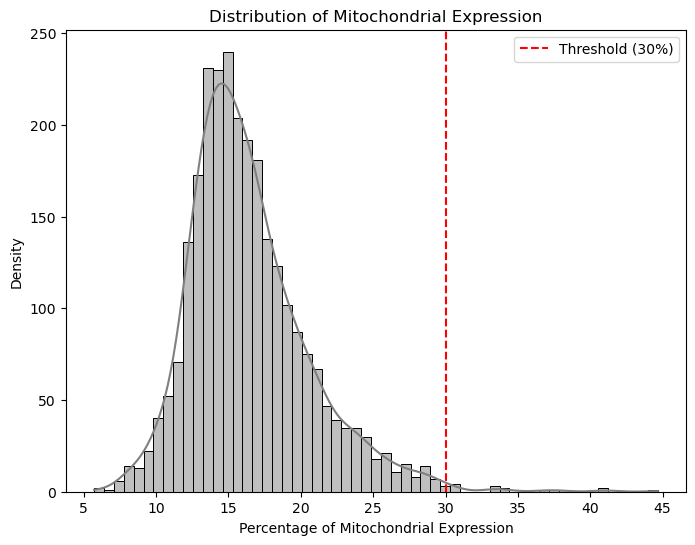

In [26]:
# Plot the distribution of mitochondrial expression
if 'pct_counts_mt' in adata.obs.columns:
    plt.figure(figsize=(8, 6))
    sns.histplot(adata.obs['pct_counts_mt'], kde=True, color='gray')
    plt.title('Distribution of Mitochondrial Expression')
    plt.xlabel('Percentage of Mitochondrial Expression')
    plt.ylabel('Density')
    plt.axvline(x=30, color='red', linestyle='--', label='Threshold (30%)')
    plt.legend()
    plt.show()
else:
    print("The 'pct_counts_mt' column does not exist in adata.obs. Skipping the histogram plot.")

In this instance, a higher percentage of mitochondrial expression is the thing to avoid, so the threshold is an upper bound, rather than the lower bounds we have observed so far. Our suggestion this time is to cut-off at 30%. Typical cut-offs lay between 15% and 30%.

In [27]:
# Apply the threshold for mitochondrial expression
threshold_mito_percent = 30
if 'pct_counts_mt' in adata.obs.columns:
    adata.obs['qc_mito'] = adata.obs['pct_counts_mt'] > threshold_mito_percent

    # Count the number of flagged spots
    flagged_mito_count = adata.obs['qc_mito'].sum()
    print(f"Number of spots with mitochondrial expression above {threshold_mito_percent}%: {flagged_mito_count}")

    adata.obs["qc_mito_plot"] = (
        adata.obs["qc_mito"]
        .map({True: "high", False: "ok"})
        .astype("category")
    )
else:
    print("The 'pct_counts_mt' column does not exist in adata.obs. Skipping thresholding.")

Number of spots with mitochondrial expression above 30%: 17


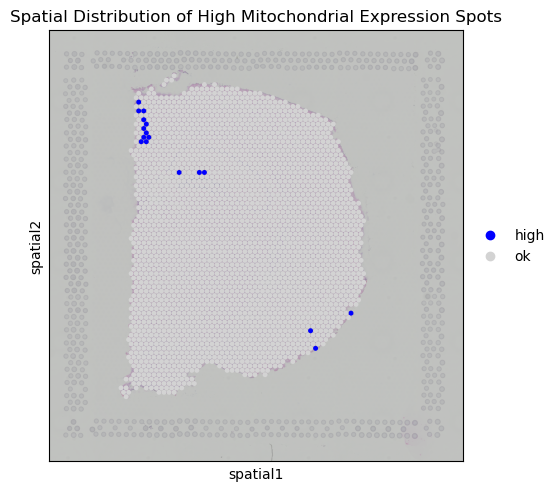

In [28]:
# Visualize spatial distribution of flagged spots based on mitochondrial expression
if 'qc_mito' in adata.obs.columns:
    sq.pl.spatial_scatter(
        adata,
        color='qc_mito_plot',
        size=1.5,
        title='Spatial Distribution of High Mitochondrial Expression Spots',
        img_alpha=.5,
        palette=ListedColormap(["blue", "lightgray"])
    )
else:
    print("The 'qc_mito' column does not exist in adata.obs. Skipping spatial visualization.")

<div style="
  padding: 12px 14px;
  border-left: 5px solid #1aa6a6;
  background: rgba(26,166,166,0.08);
  border-radius: 10px;
  margin: 10px 0;
">
  <div style="font-weight: 700; margin-bottom: 6px;">👾 Exercise</div>
  <div>
    Illustrate what happens if we set the threshold lower. Make sure not to accidentilly override the old threshold.
  </div>
</div>

Number of spots with mitochondrial expression above 20%: 445


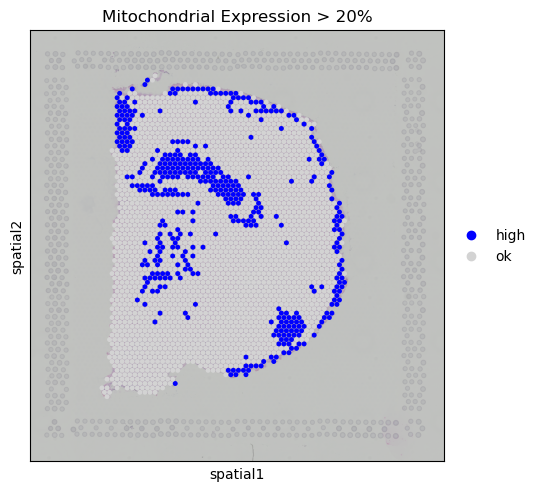

In [29]:
threshold_mito_percent_20 = 20

adata.obs['qc_mito_20'] = adata.obs['pct_counts_mt'] > threshold_mito_percent_20

# Count the number of flagged spots
flagged_mito_count = adata.obs['qc_mito_20'].sum()
print(f"Number of spots with mitochondrial expression above {threshold_mito_percent_20}%: {flagged_mito_count}")

adata.obs["qc_mito_plot_20"] = (
    adata.obs["qc_mito_20"]
    .map({True: "high", False: "ok"})
    .astype("category")
)

sq.pl.spatial_scatter(
    adata,
    color='qc_mito_plot_20',
    size=1.5,
    title=f'Mitochondrial Expression > {threshold_mito_percent_20}%',
    img_alpha=.5,
    palette=ListedColormap(["blue", "lightgray"])
)

## Filtering spots

All the steps so far have flagged spots with potential issues - before proceeding with the analysis, we want to remove these spots from our adata object. Since we have calculated different spot-level QC metrics and selected thresholds for each one, we can combine them to identify a set of low-quality spots, and remove them from our spe object in a single step.

Number of spots before filtering: 2698
Number of discarded spots for each metric:
{'qc_lib_size': np.int64(2), 'qc_expressed_genes': np.int64(2), 'qc_mito': np.int64(17)}
Total spots marked as discarded: 19
Number of spots retained after filtering: 2679


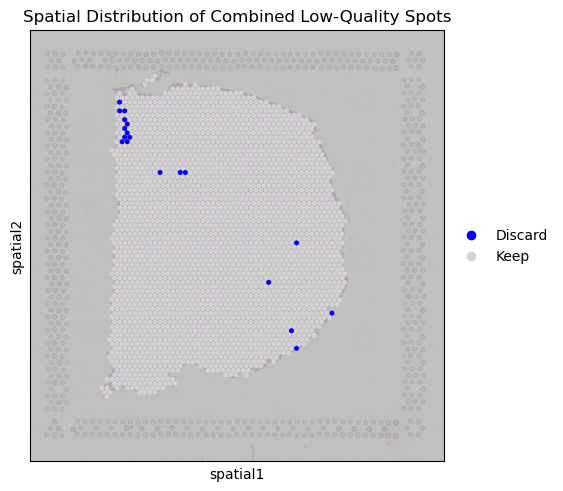

In [30]:
print(f"Number of spots before filtering: {adata.shape[0]}")

# Step 1: Check the number of discarded spots for each metric
metrics_to_check = ['qc_lib_size', 'qc_expressed_genes', 'qc_mito']
discarded_counts = {}
for metric in metrics_to_check:
    if metric in adata.obs.columns:
        discarded_counts[metric] = adata.obs[metric].sum()
    else:
        print(f"Warning: '{metric}' column not found in adata.obs.")

print("Number of discarded spots for each metric:")
print(discarded_counts)

# Step 2: Combine the set of discarded spots
if all(metric in adata.obs.columns for metric in metrics_to_check):
    adata.obs['discard'] = (
        adata.obs['qc_lib_size'] |
        adata.obs['qc_expressed_genes'] |
        adata.obs['qc_mito']
    )
    print(f"Total spots marked as discarded: {adata.obs['discard'].sum()}")
    adata.obs["discard_plot"] = (
        adata.obs["discard"]
        .map({True: "Discard", False: "Keep"})
        .astype("category")
    )
else:
    print("Error: One or more required QC metrics are missing. Cannot combine discarded spots.")

# Step 3: Visualize the spatial pattern of combined discarded spots
if 'discard' in adata.obs.columns:
    import scanpy as sc
    sq.pl.spatial_scatter(
        adata,
        color='discard_plot',
        size=1.5,
        title='Spatial Distribution of Combined Low-Quality Spots',
        img_alpha=.5,
        palette=ListedColormap(["blue", "lightgray"])
    )
else:
    print("Error: 'discard' column not found in adata.obs. Cannot visualize.")

# Step 4: Discard marked cells
adata = adata[adata.obs['discard'] == False].copy()
print(f"Number of spots retained after filtering: {adata.shape[0]}")

## Filtering genes

In [31]:
print(f"Number of genes before filtering: {adata.n_vars}")

Number of genes before filtering: 31053


Let's first make sure that don't have genes in our dataset that are expressed in less than 3 spots.

In [32]:
sc.pp.filter_genes(adata, min_cells=3)

filtered out 12149 genes that are detected in less than 3 cells


In [33]:
print(f"Number of genes retained: {adata.n_vars}")

Number of genes retained: 18904


Mitochondrial genes are often not that interesting for any of our downstream analyses, so if we like we can filter them out entirely after QC.

<div style="
  padding: 12px 14px;
  border-left: 5px solid #7E57C2;
  background: rgba(126,87,194,0.08);
  border-radius: 10px;
  margin: 10px 0;
">
  <div style="font-weight: 700; margin-bottom: 6px;">🪞 Reflection</div>
  <div>
    Before removing mitochondrial genes, ask yoursef:
    <ul>
      <li>Could this signal represent biology rather than noise? What kind of signal could be biologically relevant for us?</li>
      <li>How might this affect PCA structure?</li>
    </ul>
  </div>

  <details style="
    margin-top: 10px;
    padding: 8px 10px;
    background: rgba(0,0,0,0.05);
    border-radius: 8px;
  ">
    <summary style="cursor: pointer; font-weight: 600;">
      🔎 Click to reveal answer
    </summary>
    <div style="margin-top: 8px;">
      High mitochondrial expression can reflect stress, hypoxia,
      metabolic reprogramming, or apoptosis. Removing these genes
      may distort variance structure and artificially “clean” embeddings.
    </div>
  </details>
</div>

In [34]:
adata = adata[:, ~adata.var['mt']].copy()   # optional
print(f"Number of genes retained after MT filter: {adata.n_vars}")

Number of genes retained after MT filter: 18891


<div style="
  padding: 12px 14px;
  border: 1px solid rgba(0,0,0,0.12);
  background: rgba(26,166,166,0.08);
  border-radius: 10px;
  margin: 10px 0;
">
  <div style="font-weight: 700; margin-bottom: 6px;">👾 Task</div>
  <ol style="margin: 0 0 0 18px;">
        <li>Plot the most highly expressed genes again after filtering.</li>
        <li>Now that we have cleaned up our dataset, check what biological function the most highly expressed genes have by google'ing. What is the relevance of these genes? Databases like <a href="https://maayanlab.cloud/Enrichr/#find Enrichr">EnrichR</a>, <a href="https://reactome.org/">Reactome</a>, <a href="https://www.genome.jp/kegg/">KEGG</a>, or <a href="https://www.gsea-msigdb.org/gsea/msigdb">MSigDB</a> allow you to quickly look up which biological pathways a given gene is annotated to. Try out <a href="https://reactome.org/">Reactome</a> for this purpose (not all genes are present in the database).</li>
  </ol>

  <details style="
    margin-top: 10px;
    padding: 8px 10px;
    background: rgba(0,0,0,0.05);
    border-radius: 8px;
  ">
    <summary style="cursor: pointer; font-weight: 600;">
      🔎 Click to reveal answer
    </summary>
    <div style="margin-top: 8px;">
      The most highly expressed genes are typically housekeeping genes, ubiquitously expressed and involved in basic cellular processes like translation, metabolism, or mitochondrial function, meaning they are biologically essential but not necessarily informative for distinguishing cell types or states.
    </div>
  </details>
</div>

normalizing counts per cell
    finished (0:00:00)


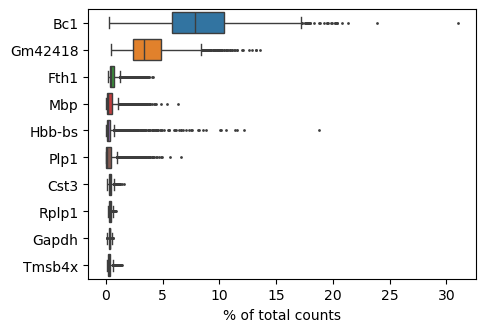

In [35]:
sc.pl.highest_expr_genes(adata, n_top=n)

# Dimensionality reduction and clustering

We use dimensionality reduction, clustering, and visualization techniques to analyze the structure of our dataset, group similar cells, and visualize their relationships. Here, we borrow a lot of the methods that are used in scRNAseq analysis.

First, we apply Principal Component Analysis (PCA) to reduce the high-dimensional gene expression data into a smaller set of principal components, retaining the main patterns of variation while reducing noise.

Then, we create a neighbors graph, which identifies connections between cells based on their similarity in the reduced PCA space, capturing local relationships essential for clustering. Using the Leiden clustering algorithm, we group cells into clusters based on these connections, allowing us to identify groups of similar cells that may represent distinct cell types or states.

We then apply UMAP (Uniform Manifold Approximation and Projection), a technique that reduces the data to two dimensions for visualization, preserving both local and global structures in the data.

Finally, we generate a UMAP plot with cells colored by their assigned clusters, providing an overview of the dataset's structure and making it easy to spot distinct cell populations or clusters. This visualization gives us an interpretable view of the relationships within our data, helping us understand its organization before further analysis.

### Using raw counts

To see how normalization affects dimensionality reduction and clustering, first we will run PCA, clustering and UMAP without any normalization. Then we can compare the results with the normalized data later.

<div style="
  padding: 12px 14px;
  border-left: 5px solid #1aa6a6;
  background: rgba(26,166,166,0.08);
  border-radius: 10px;
  margin: 10px 0;
">
  <div style="font-weight: 700; margin-bottom: 6px;">🧠 Note</div>
  <div>
    PCA is used before UMAP/t-SNE to denoise and make neighborhood structure more stable.
  </div>
</div>

computing PCA
    with n_comps=50
    finished (0:00:03)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:08)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP


/tmp/ipykernel_86/3914631849.py:3: FutureWarning: The `igraph` implementation of leiden clustering is *orders of magnitude faster*. Set the flavor argument to (and install if needed) 'igraph' to use it.
In the future, the default backend for leiden will be igraph instead of leidenalg. To achieve the future defaults please pass: `flavor='igraph'` and `n_iterations=2`. `directed` must also be `False` to work with igraph’s implementation.
  sc.tl.leiden(adata)


    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:08)


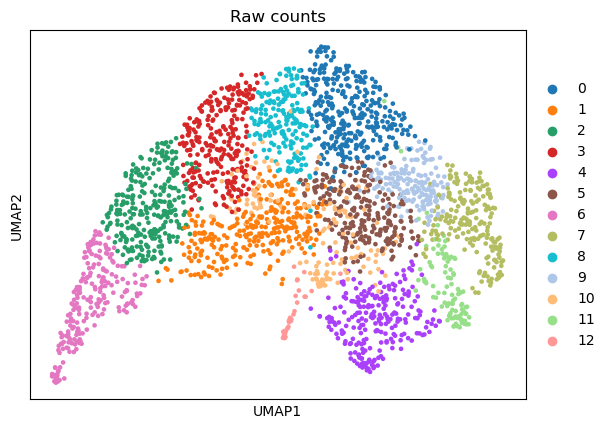

In [36]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.leiden(adata)
sc.tl.umap(adata)
sc.pl.umap(adata, color='leiden', title='Raw counts')

We save the resulting umap and clustering in new slots in ``.obs`` and ``.obsm`` as they will otherwise be overwritten when we run new analyses.

In [37]:
adata.obsm['X_umap_counts'] = adata.obsm['X_umap']
adata.obs['leiden_counts'] = adata.obs['leiden']

# Normalization

## *Normalization in Spatial Transcriptomics (STx) Data*

Normalization adjusts for cell-specific technical differences, and log transformation makes the data easier to analyze by reducing the effects of extreme values. This normalization and transformation make the dataset more appropriate for dimensionality reduction, clustering, and other analyses.

---

### *SRT vs. scRNA-seq Normalization*

Normalization in STx differs from scRNA-seq due to the following challenges:

- **Spots Containing Multiple Cell Types:**
  - Unlike single-cell data, spatial transcriptomics spots typically capture transcripts from multiple cells, cell types, and tissue domains, complicating assumptions about cell-level expression distributions.
- **Clustering Variability:**
  - Spatial datasets often span multiple tissue sections or patients, introducing systematic differences in sequencing depth, capture efficiency, and tissue composition.
- **Importance in SRT:**
  - Proper normalization is fundamental for reliable downstream analyses, as it minimizes technical biases while preserving biologically meaningful spatial variation.
 
---

### *Normalization Methods*

#### **Log-Normalization**
- **Purpose:** Stabilizes variance and prevents dominance by highly expressed genes.
- **Methodology:**
  - Raw counts are normalized to a fixed target sum per spot (e.g. counts per million, CPM).
  - A log-transformation is applied after adding a pseudocount of 1 to avoid undefined values for zero counts (often implemented as ``log1p(x) = log(x + 1)``).
- **Benefit:**
  - Compresses the dynamic range of expression values.
  - Makes fold changes more symmetric and easier to interpret.
  - Widely used and well-supported across downstream tools.
- **Limitations:**
  - Does not explicitly model mean–variance relationships.
  - Library size differences may still influence highly expressed genes.

---

#### **Pearson Residuals**
- **Purpose:** Remove technical effects (e.g. sequencing depth) while accounting for gene-specific mean–variance relationships.
- **Methodology:**
  - Suggested in [Lause et al 2021](https://genomebiology.biomedcentral.com/articles/10.1186/s13059-021-02451-7), which is conceptually related to SCTransform, but simpler and faster.
  - Gene counts are modeled using a negative binomial (NB) regression, where the expected expression of each gene depends on sequencing depth.
  - For each gene–spot pair, a Pearson residual is computed:
    - It measures how much the observed count deviates from the model’s expectation, scaled by the expected variance.
- **Benefit:**
  - Reduces dominance of library size while preserving subtle spatial expression patterns.
  - Directly represents variance within the dataset → Highly variable genes (HVGs) don't need to be computed separately.
  - Ideal for neighborhood graphs and PCA.
- **Limitations:**
  - Residuals are not on an expression scale and should not be interpreted as normalized counts.
  - Requires careful handling for visualization and differential expression.

There are more normalization methods, but we will leave at to these two during this course.

### Lognorm

In [38]:
# First, save the raw counts in the layer "raw" in case we want to revert to those again later
adata.layers['raw'] = adata.X.copy()

sc.pp.normalize_total(adata, target_sum=1e6)
sc.pp.log1p(adata)

normalizing counts per cell
    finished (0:00:00)


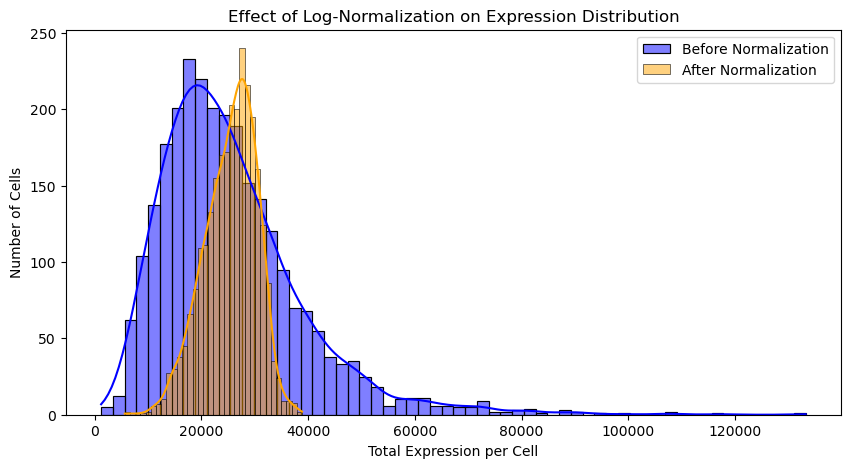

In [39]:
original_counts = adata.layers['raw'].sum(axis=1)
normalized_counts = adata.X.sum(axis=1)

plt.figure(figsize=(10, 5))
sns.histplot(original_counts.A1, color="blue", label="Before Normalization", kde=True) 
sns.histplot(normalized_counts.A1, color="orange", label="After Normalization", kde=True)
plt.xlabel("Total Expression per Cell")
plt.ylabel("Number of Cells")
plt.title("Effect of Log-Normalization on Expression Distribution")
plt.legend()
plt.show()

computing PCA
    with n_comps=50
    finished (0:00:09)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 13 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP


/tmp/ipykernel_86/3881929772.py:3: FutureWarning: The `igraph` implementation of leiden clustering is *orders of magnitude faster*. Set the flavor argument to (and install if needed) 'igraph' to use it.
In the future, the default backend for leiden will be igraph instead of leidenalg. To achieve the future defaults please pass: `flavor='igraph'` and `n_iterations=2`. `directed` must also be `False` to work with igraph’s implementation.
  sc.tl.leiden(adata)


    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:08)


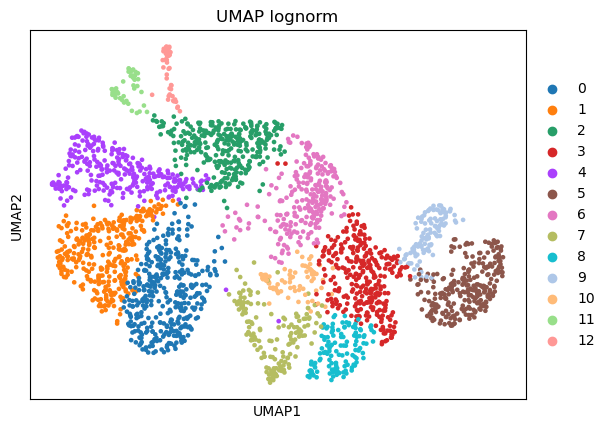

In [40]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.leiden(adata)
sc.tl.umap(adata)
sc.pl.umap(adata, color='leiden', title='UMAP lognorm')

In [41]:
# Save the new clustering and umap
adata.obsm['X_umap_lognorm'] = adata.obsm['X_umap']
adata.obs['leiden_lognorm'] = adata.obs['leiden']

# save the lognorm as its own layer
adata.layers['lognorm'] = adata.X.copy()

### Pearson Residuals Normalization

In [42]:
# Revert back to counts
adata.X = adata.layers['raw'].copy()
sc.experimental.pp.normalize_pearson_residuals(adata)
# Now the X matrix is an array instead

computing analytic Pearson residuals on adata.X
    finished (0:00:00)


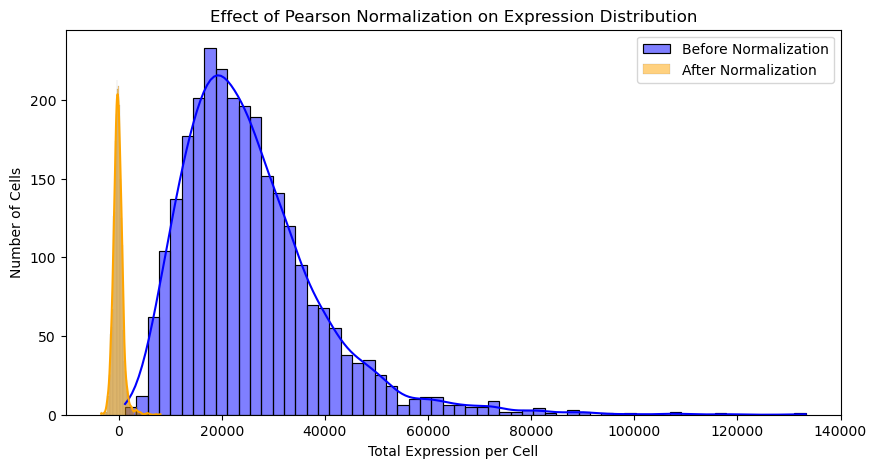

In [43]:
original_counts = adata.layers['raw'].sum(axis=1)
normalized_counts = adata.X.sum(axis=1)

plt.figure(figsize=(10, 5))
sns.histplot(original_counts.A1, color="blue", label="Before Normalization", kde=True) 
sns.histplot(normalized_counts, color="orange", label="After Normalization", kde=True)
plt.xlabel("Total Expression per Cell")
plt.ylabel("Number of Cells")
plt.title("Effect of Pearson Normalization on Expression Distribution")
plt.legend()
plt.show()

computing PCA
    with n_comps=50
    finished (0:00:01)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:00)
computing UMAP


/tmp/ipykernel_86/722672692.py:3: FutureWarning: The `igraph` implementation of leiden clustering is *orders of magnitude faster*. Set the flavor argument to (and install if needed) 'igraph' to use it.
In the future, the default backend for leiden will be igraph instead of leidenalg. To achieve the future defaults please pass: `flavor='igraph'` and `n_iterations=2`. `directed` must also be `False` to work with igraph’s implementation.
  sc.tl.leiden(adata)


    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:00:08)


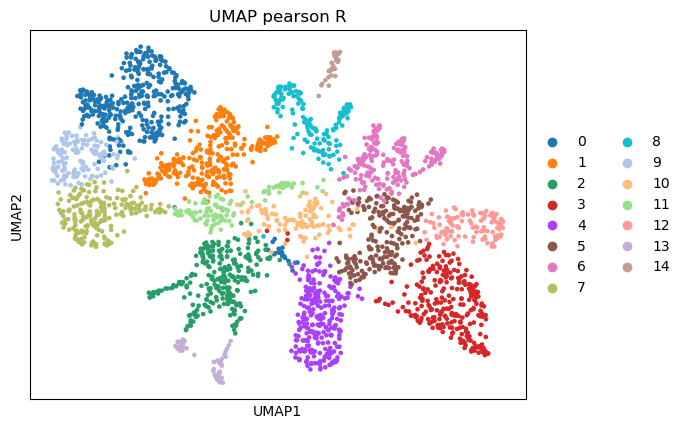

In [44]:
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.leiden(adata)
sc.tl.umap(adata)
sc.pl.umap(adata, color='leiden', title='UMAP pearson R')

In [45]:
adata.obsm['X_umap_pearson'] = adata.obsm['X_umap']
adata.obs['leiden_pearson'] = adata.obs['leiden']

adata.layers['pearson'] = adata.X.copy()

Now we can plot all of the different umaps together and compare them.

First lets plot them with their individual clusterings:

<Axes: title={'center': 'Umap pearson'}, xlabel='umap_pearson1', ylabel='umap_pearson2'>

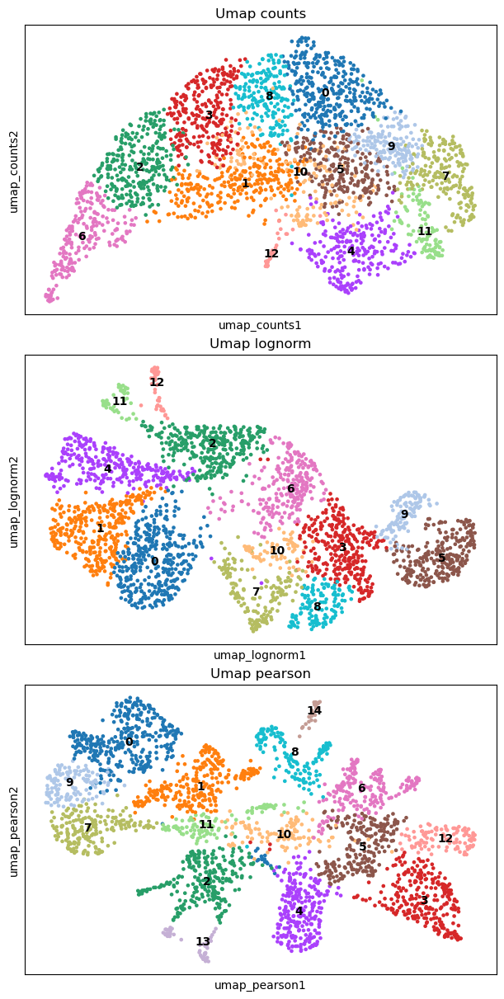

In [46]:
fig, axs = plt.subplots(3, figsize=(6,12), constrained_layout=True)
sc.pl.embedding(adata, color='leiden_counts', basis='umap_counts', title='Umap counts', ax=axs[0], show=False, legend_loc='on data')
sc.pl.embedding(adata, color='leiden_lognorm', basis='umap_lognorm', title='Umap lognorm', ax=axs[1], show=False, legend_loc='on data') 
sc.pl.embedding(adata, color='leiden_pearson', basis='umap_pearson', title='Umap pearson', ax=axs[2], show=False, legend_loc='on data')

But to see how the cells are shifting place in the umaps, we can also plot them all with the same clustering. In this case we use the clustering with lognorm.

<Axes: title={'center': 'Umap pearson'}, xlabel='umap_pearson1', ylabel='umap_pearson2'>

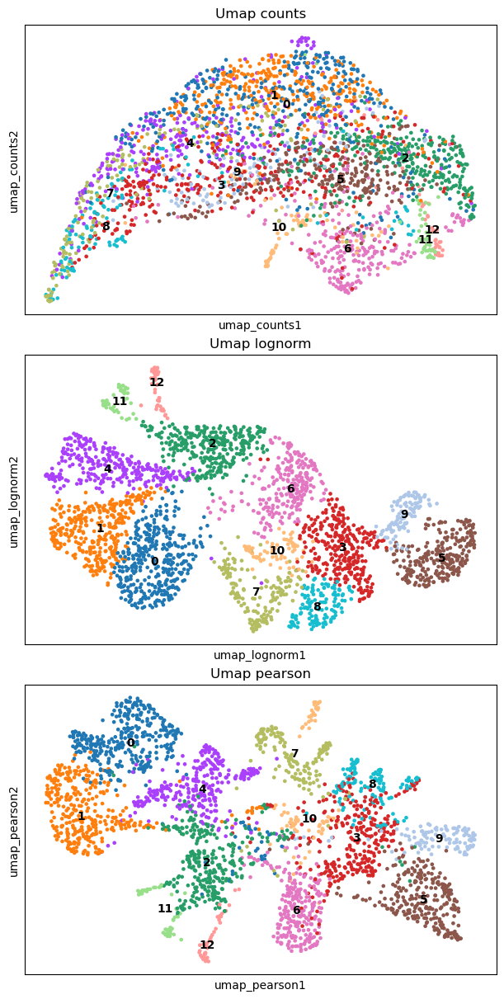

In [47]:
# all with clustering from lognorm coloring.

fig, axs = plt.subplots(3, figsize=(6,12), constrained_layout=True)
sc.pl.embedding(adata, color='leiden_lognorm', basis='umap_counts', title='Umap counts', ax=axs[0], show=False, legend_loc='on data')
sc.pl.embedding(adata, color='leiden_lognorm', basis='umap_lognorm', title='Umap lognorm', ax=axs[1], show=False, legend_loc='on data') 
sc.pl.embedding(adata, color='leiden_lognorm', basis='umap_pearson', title='Umap pearson', ax=axs[2], show=False, legend_loc='on data')

<div style="
  padding: 12px 14px;
  border-left: 5px solid #7E57C2;
  background: rgba(126,87,194,0.08);
  border-radius: 10px;
  margin: 10px 0;
">
  <div style="font-weight: 700; margin-bottom: 6px;">🪞 Reflection</div>
  <div>
    Compare UMAP plots with different normalization methods. What differences do you see in the UMAP plots?
  </div>
</div>

As you can tell, we have more distinct clusters after normalization compared to the raw counts. And to a large degree they agree between the methods but there are some regions where the clustering may differ.

We can also visualize the clustering onto the sections:

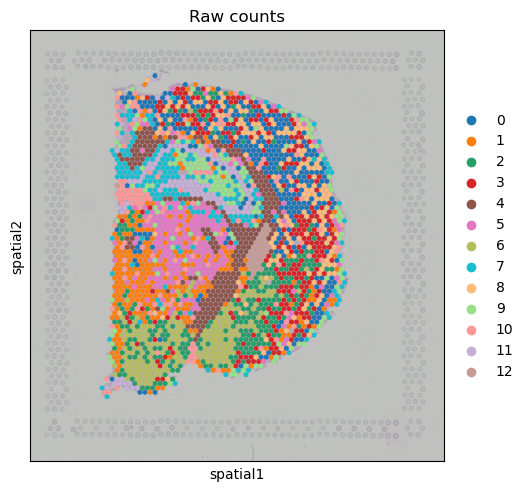

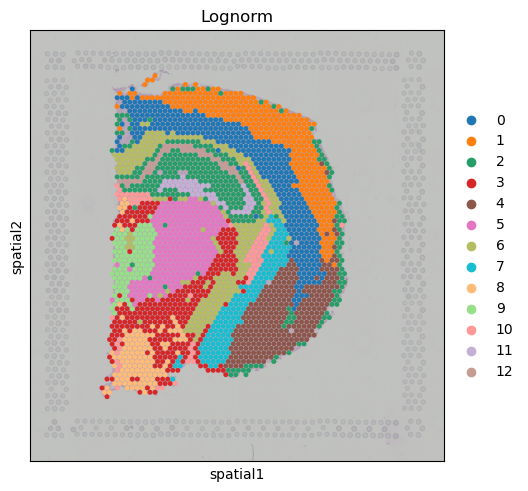

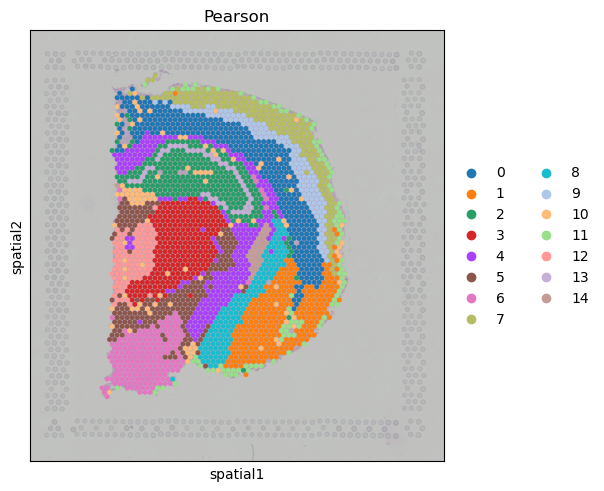

In [48]:
# Plot all with same colors to make more comparable
sq.pl.spatial_scatter(adata, color='leiden_counts', size=1.5, img_alpha=.5, title="Raw counts", palette=ListedColormap(adata.uns['leiden_pearson_colors']))
sq.pl.spatial_scatter(adata, color='leiden_lognorm', size=1.5, img_alpha=.5, title="Lognorm", palette=ListedColormap(adata.uns['leiden_pearson_colors']))
sq.pl.spatial_scatter(adata, color='leiden_pearson', size=1.5, img_alpha=.5, title="Pearson")

It looks like we have better separation of cortical layers with log-normalization.

Using vioilin plots to see how the clusters are distributed in terms of gene expression (number of genes and the total counts). This helps us understand the characteristics of each cluster in terms of gene expression levels, and other features, providing insights into the biological properties of each cluster.

It may also indicate a technical bias in the clustering if spots of similar quality are grouped together.

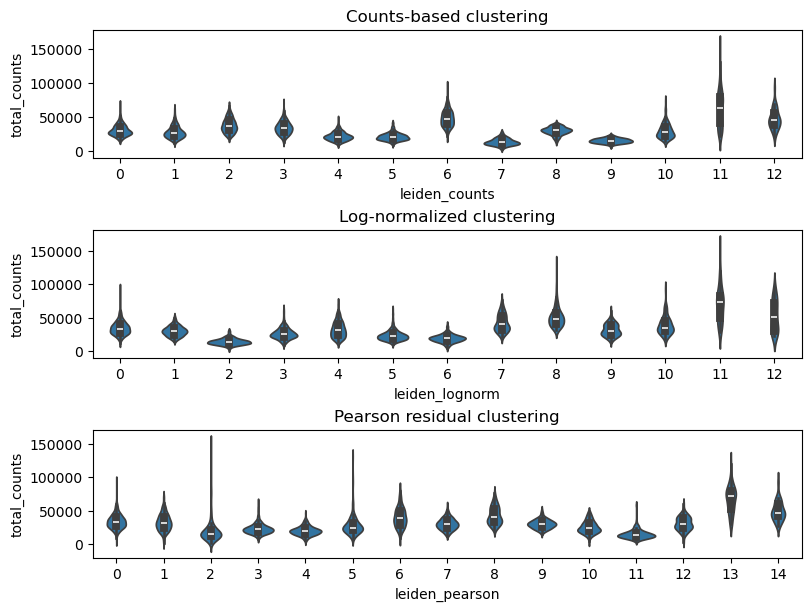

In [49]:
fig, axs = plt.subplots(3, figsize=(8, 6), constrained_layout=True)

sns.violinplot(
    data=adata.obs,
    x="leiden_counts",
    y="total_counts",
    ax=axs[0]
)
axs[0].set_title("Counts-based clustering")

sns.violinplot(
    data=adata.obs,
    x="leiden_lognorm",
    y="total_counts",
    ax=axs[1]
)
axs[1].set_title("Log-normalized clustering")

sns.violinplot(
    data=adata.obs,
    x="leiden_pearson",
    y="total_counts",
    ax=axs[2]
)
axs[2].set_title("Pearson residual clustering")

plt.show()

<div style="
  padding: 12px 14px;
  border-left: 5px solid #1aa6a6;
  background: rgba(26,166,166,0.08);
  border-radius: 10px;
  margin: 10px 0;
">
  <div style="font-weight: 700; margin-bottom: 6px;">🧠 Note</div>
  <div>
    Here we can clearly see the clusters that cover the pyramidal layers of the hippocampus, aka, the areas with high cell density showing higher RNA counts compared to all other clusters.
  </div>
</div>

# Selecting genes

### Background

Gene selection - or alternatively “feature selection” - is applied to identify genes that are likely to be informative for downstream analyses. The most common feature selection method is the definition of highly variable genes (HVGs). The assumption is that since we quality-controlled and normalised our dataset, the genes with high variability are the ones that contain high levels of biological variability too. Since here we have a spatial dataset we can also try to identify spatially variable genes too (SVGs), but we will go more in depth on the topic of SVG in practical 13.

It is important to note that HVGs are identified solely from the gene expression data. Spatial information does not play a role in finding HVGs. STx data pose a dilemma; does the meaningful spatial information reflect only spatial distribution of major cell types or does it reflect additional important spatial features? If we believe the former, relying on HVGs can be enough. If the second also holds true though, it is important to identify SVGs as well.

### Highly Variable Genes (HVGs)

Right now, let's check how HVG are affected by the previous normalisation strategies.

#### HVGs from log-normalized counts

extracting highly variable genes
    finished (0:00:00)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)
Top 20 HVGs:
Tnnt1
Gal
Hcrt
Baiap3
Gm5741
Shox2
Agrp
Synpo2
Myoc
Ctxn3
Oxt
Tmem212
Prkcd
Spink8
Calml4
1500015O10Rik
Zic1
Tcf7l2
Tagln
Pmch


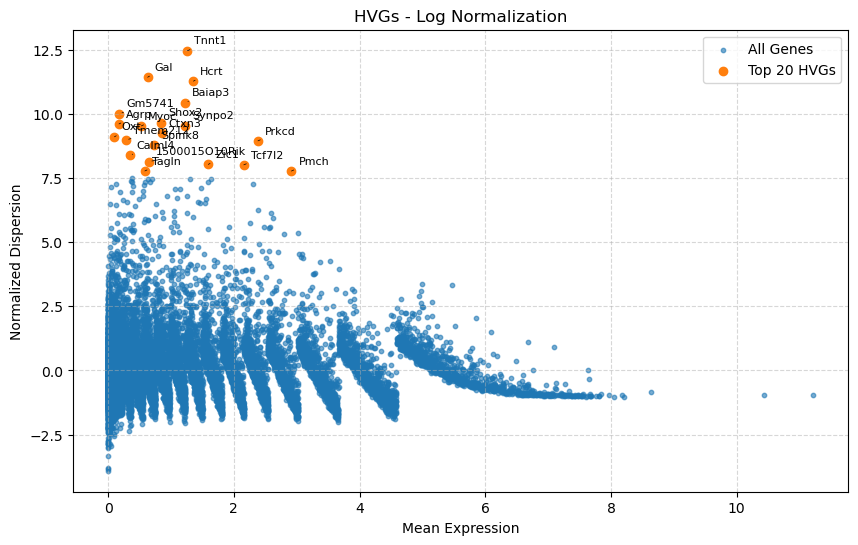

In [50]:
norm_adata = adata.copy()
norm_adata.X = adata.layers['lognorm'].copy()

# Step 1: Filter out genes with near-zero mean expression
if issparse(norm_adata.X):  # Handle sparse matrices
    gene_filter = norm_adata.X.mean(axis=0).A1 > 1e-12
else:  # Dense matrices
    gene_filter = norm_adata.X.mean(axis=0) > 1e-12
norm_adata = norm_adata[:, gene_filter].copy()  # Filter genes

# Step 2: Identify highly variable genes
sc.pp.highly_variable_genes(
    norm_adata,
    flavor="cell_ranger",  # Use cell_ranger flavor for robust HVG detection
    n_top_genes=2000,  # Top 10% HVGs
    subset=False  # Do not subset the data yet
)

# Step 3: Get the top 20 HVGs by dispersion
top_20_hvgs = norm_adata.var[norm_adata.var["highly_variable"]].sort_values(
    by="dispersions_norm", ascending=False
).head(20)

# Print top HVGs
n_top = 20
print(f"Top {n_top} HVGs:")
for i, gene in enumerate(top_20_hvgs.index.tolist()):
        print(gene)

# Step 4: Plot HVGs manually
plt.figure(figsize=(10, 6))
plt.scatter(
    norm_adata.var["means"], norm_adata.var["dispersions_norm"], alpha=0.6, s=10, label="All Genes"
)
plt.scatter(
    top_20_hvgs["means"], top_20_hvgs["dispersions_norm"], label="Top 20 HVGs"
)

# Annotate top HVGs
for gene, x, y in zip(
    top_20_hvgs.index,
    top_20_hvgs["means"],
    top_20_hvgs["dispersions_norm"],
):
    plt.annotate(
        gene,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        fontsize=8,
        arrowprops=dict(arrowstyle="-", lw=0.5),
    )

plt.xlabel("Mean Expression")
plt.ylabel("Normalized Dispersion")
plt.title(f"HVGs - Log Normalization")
plt.legend()
plt.grid(True, linestyle="--", alpha=0.5)
plt.show()

#### Pearson residuals as HV

After Pearson residual normalization, HVGs are simply the genes with the largest residual variance.

In [51]:
# Compute variance per gene
adata_norm = adata.copy()
adata_norm.X = adata.layers['pearson'].copy()
gene_variances = np.var(adata_norm.X, axis=0)

# Select top N genes
n_top_genes = 2000
top_genes = np.argsort(gene_variances)[-n_top_genes:]

# Store HVG flag
adata.var["highly_variable"] = False
adata.var.iloc[top_genes, adata.var.columns.get_loc("highly_variable")] = True

Top 20 HVGs:
Trf
Apod
Prkcd
Enpp2
Hpca
Pcp4
Cnp
Mal
Pmch
Sst
Ttr
Fth1
Mobp
Hbb-bt
Ptgds
Hba-a2
Hba-a1
Hbb-bs
Mbp
Plp1


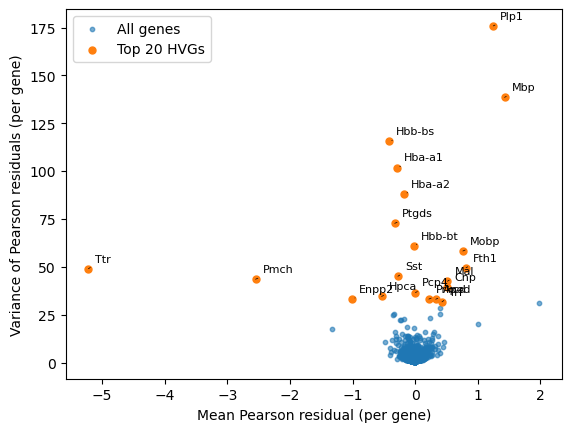

In [52]:
from scipy import sparse

# gene-wise mean/variance of Pearson residuals
if sparse.issparse(adata_norm.X):
    gene_means = np.asarray(adata_norm.X.mean(axis=0)).ravel()
    gene_vars  = np.asarray(adata_norm.X.power(2).mean(axis=0)).ravel() - gene_means**2
else:
    gene_means = adata_norm.X.mean(axis=0)
    gene_vars  = adata_norm.X.var(axis=0)

adata_norm.var["pearson_mean"] = gene_means
adata_norm.var["pearson_var"]  = gene_vars

# pick top HVGs by residual variance
top_idx = np.argsort(gene_vars)[-n_top:]
top_hvgs = adata_norm.var.iloc[top_idx]

# Print top HVGs
print(f"Top {n_top} HVGs:")
for i, gene in enumerate(top_hvgs.index.tolist()):
        print(gene)

# plot (mean vs variance)
plt.figure()
plt.scatter(adata_norm.var["pearson_mean"], adata_norm.var["pearson_var"], alpha=0.6, s=10, label="All genes")
plt.scatter(top_hvgs["pearson_mean"], top_hvgs["pearson_var"], s=25, label=f"Top {n_top} HVGs")

# Annotate top HVGs
for gene, x, y in zip(
    top_hvgs.index,
    top_hvgs["pearson_mean"],
    top_hvgs["pearson_var"],
):
    plt.annotate(
        gene,
        xy=(x, y),
        xytext=(5, 5),
        textcoords="offset points",
        fontsize=8,
        arrowprops=dict(arrowstyle="-", lw=0.5),
    )

plt.xlabel("Mean Pearson residual (per gene)")
plt.ylabel("Variance of Pearson residuals (per gene)")
plt.legend()
plt.show()

Unlike log-normalized HVG plots, genes are not selected for unusual means. All genes are centered around zero — HVGs stand out by variance alone. This is why Pearson residuals are ideal for PCA and neighborhood graphs.

<div style="
  padding: 12px 14px;
  border-left: 5px solid #7E57C2;
  background: rgba(126,87,194,0.08);
  border-radius: 10px;
  margin: 10px 0;
">
  <div style="font-weight: 700; margin-bottom: 6px;">🪞 Reflection</div>
  <div>
    Which of these gene-sets appear more biologically plausible based on prior knowledge (e.g. <a href="https://maayanlab.cloud/Enrichr/">EnrichR</a>)?
  </div>

  <details style="
    margin-top: 10px;
    padding: 8px 10px;
    background: rgba(0,0,0,0.05);
    border-radius: 8px;
  ">
    <summary style="cursor: pointer; font-weight: 600;">
      🔎 Click to reveal answer
    </summary>
    <div style="margin-top: 8px;">
      Looking at the cell types that the top 20 HGVs associate with, the log-normalization seems to have done a better job in preserving the biological variation in the dataset.
    </div>
  </details>
</div>

In [53]:
import gc 
gc.collect()

4890

# Visium_HD

Let's take a look at the latest generation of the Visium Spatial Gene Expression assay - Visium HD.
The dataset we will be using here was obtained from fresh frozen mouse brain tissue. ([more info](https://www.10xgenomics.com/datasets/visium-hd-three-prime-mouse-brain-fresh-frozen)).

Visium HD data is best thought of as a very large, high-resolution spatial point cloud with a resolution of 2µm that gets aggregated into bins of different sizes after sequencing.
Here is an overview of what possible binnings roughly capture and when they might be useful to look at:

| Bin size | Approx. biological scale | What it roughly captures | Typical number of bins (whole section) | Example use cases |
|--------------|--------------------------|---------------------------|----------------------------------------|------------------|
| **2 µm** | Subcellular / pixel-scale | Partial cell bodies, nuclei fragments | Millions | Raw signal inspection, method development, advanced spatial statistics |
| **8 µm** | Single-cell scale | Individual cells (small cells) or partial larger cells | Hundreds of thousands | Cell type mapping, cell–cell proximity, deconvolution benchmarking |
| **16 µm** | Small multicellular | 2–5 cells per bin | Tens of thousands | Stable clustering, spatial domain discovery, integration with scRNA-seq |
| **32 µm** | Multicellular / micro-niche | 5–15 cells per bin | Few thousand | Tissue architecture, region-level analysis, pathway activity mapping |
| **64 µm** | Tissue-level | Many cells, Visium-like spots | ~1–2 thousand | Sample-level comparisons, visualization, legacy Visium workflows |

Visium HD data is generated at extremely high spatial resolution, resulting in millions of small capture locations across a tissue section. While this resolution preserves fine spatial detail, it also introduces substantial technical noise and computational burden. Each binning level is a separate dataset with its own count matrix, spatial coordinates, and metadata, which makes for huge files.

Aggregating bins serves several key purposes:
  - **Improved signal-to-noise ratio:**
Summing counts across neighboring bins reduces stochastic sampling noise inherent to very small capture areas.
  - **Biologically meaningful units:**
Many biological questions are naturally framed at the level of cells, micro-niches, or tissue regions rather than subcellular pixels.
  - **Computational feasibility:**
Aggregation dramatically reduces data size, making downstream analyses such as clustering, dimensionality reduction, and visualization tractable.
  - **Flexibility of analysis scale:**
Aggregation allows the same dataset to be analyzed at multiple spatial resolutions depending on the biological question.

Instead of aggregating bins using a fixed grid, Visium HD data can be aggregated based on a cell segmentation derived from histological images. This yields a cell-level expression matrix that is more directly comparable to single-cell RNA-seq data while retaining spatial coordinates. As we have only restricted RMA available during this course, we will only be loading the segmention-based binning data in this case.

In [54]:
import pandas as pd, spatialdata, spatialdata_io
print("pandas", pd.__version__)
print("spatialdata", spatialdata.__version__)
print("spatialdata-io", spatialdata_io.__version__)

pandas 2.3.3
spatialdata 0.6.1
spatialdata-io 0.6.0


In [55]:
visium_hd_data_path = "/home/jovyan/shared/day-03/data/visium_hd_mouse_brain"
sdata_visium_hd = visium_hd(
    visium_hd_data_path,
    filtered_counts_file=False,
    load_segmentations_only=True
)

Found segmentation data. Incorporating cell_segmentations.
reading /home/jovyan/shared/day-03/data/visium_hd_mouse_brain/segmented_outputs/filtered_feature_cell_matrix.h5
 (0:00:01)


/opt/conda/envs/p10_qc_normalization/lib/python3.12/site-packages/anndata/_core/anndata.py:1813: UserWarning: Variable names are not unique. To make them unique, call `.var_names_make_unique`.
  utils.warn_names_duplicates("var")
/tmp/ipykernel_86/2439264094.py:2: UserWarning: No full resolution image found. If incorrect, please specify the path in the `fullres_image_file` parameter when calling the `visium_hd` reader function.
  sdata_visium_hd = visium_hd(


In [56]:
sdata_visium_hd

SpatialData object
├── Images
│     ├── 'Visium_HD_3prime_Mouse_Brain_hires_image': DataArray[cyx] (3, 5492, 6000)
│     └── 'Visium_HD_3prime_Mouse_Brain_lowres_image': DataArray[cyx] (3, 549, 600)
├── Shapes
│     └── 'Visium_HD_3prime_Mouse_Brain_cell_segmentations': GeoDataFrame shape: (84031, 2) (2D shapes)
└── Tables
      └── 'cell_segmentations': AnnData (84031, 33696)
with coordinate systems:
    ▸ 'Visium_HD_3prime_Mouse_Brain', with elements:
        Visium_HD_3prime_Mouse_Brain_hires_image (Images), Visium_HD_3prime_Mouse_Brain_lowres_image (Images), Visium_HD_3prime_Mouse_Brain_cell_segmentations (Shapes)
    ▸ 'Visium_HD_3prime_Mouse_Brain_downscaled_hires', with elements:
        Visium_HD_3prime_Mouse_Brain_hires_image (Images), Visium_HD_3prime_Mouse_Brain_cell_segmentations (Shapes)
    ▸ 'Visium_HD_3prime_Mouse_Brain_downscaled_lowres', with elements:
        Visium_HD_3prime_Mouse_Brain_lowres_image (Images), Visium_HD_3prime_Mouse_Brain_cell_segmentations (Shapes)

Let's make the var names unique. This improves performance in accessing the tabular data and is necessary to be able to plot the data

In [57]:
for table in sdata_visium_hd.tables.values():
    table.var_names_make_unique()

In [58]:
# Store keys in variables
img_key = "Visium_HD_3prime_Mouse_Brain_hires_image"
shapes_key = "Visium_HD_3prime_Mouse_Brain_cell_segmentations"
seg_table = "cell_segmentations"
cs = "Visium_HD_3prime_Mouse_Brain"

We can data a look at the dimensions of our high resolution image. The output values are the number of pixels in the x and y direction.

In [59]:
from spatialdata import get_extent

data_extent = get_extent(
    sdata_visium_hd["Visium_HD_3prime_Mouse_Brain_hires_image"],
    coordinate_system="Visium_HD_3prime_Mouse_Brain",
)
data_extent

{'y': (np.float64(0.0), np.float64(19513.075572663645)),
 'x': (np.float64(0.0), np.float64(21317.99953313581))}

Now let's take a look at the actual image and the corresponding cell segmentation. In this case, we have got a GeoDataFrame of polygons as shapes to plot.

INFO     Rasterizing image for faster rendering.                                                                   


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.012..1.0].


INFO     Using 'datashader' backend with 'sum' as reduction method to speed up plotting. Depending on the reduction
         method, the value range of the plot might change. Set method to 'matplotlib' to disable this behaviour.   


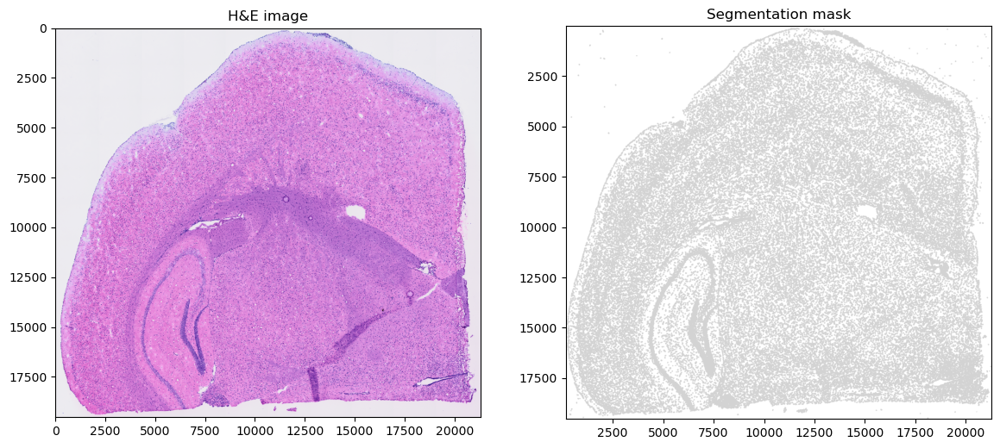

In [60]:
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

(
    sdata_visium_hd.pl.render_images(
        img_key
    )
    .pl.show(
        coordinate_systems=cs, ax=axes[0],
        title='H&E image')
)

(
    sdata_visium_hd.pl.render_shapes(
        shapes_key,
        method="datashader"
    ).pl.show(
        coordinate_systems=cs, ax=axes[1],
        title='Segmentation mask'
    )
)

So as with the classical Visium data, let's first take a look at the most highly expressed genes.

normalizing counts per cell
    finished (0:00:00)


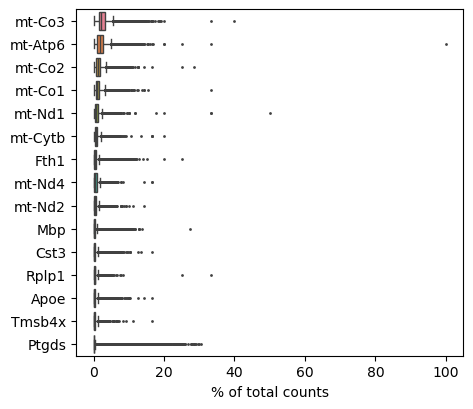

In [61]:
n = 15
sc.pl.highest_expr_genes(sdata_visium_hd[seg_table], n_top=n)

Let's now plot the expression of some of these genes spatially.

INFO     Using 'datashader' backend with 'sum' as reduction method to speed up plotting. Depending on the reduction
         method, the value range of the plot might change. Set method to 'matplotlib' to disable this behaviour.   
INFO     Using the datashader reduction "sum". "max" will give an output very close to the matplotlib result.      


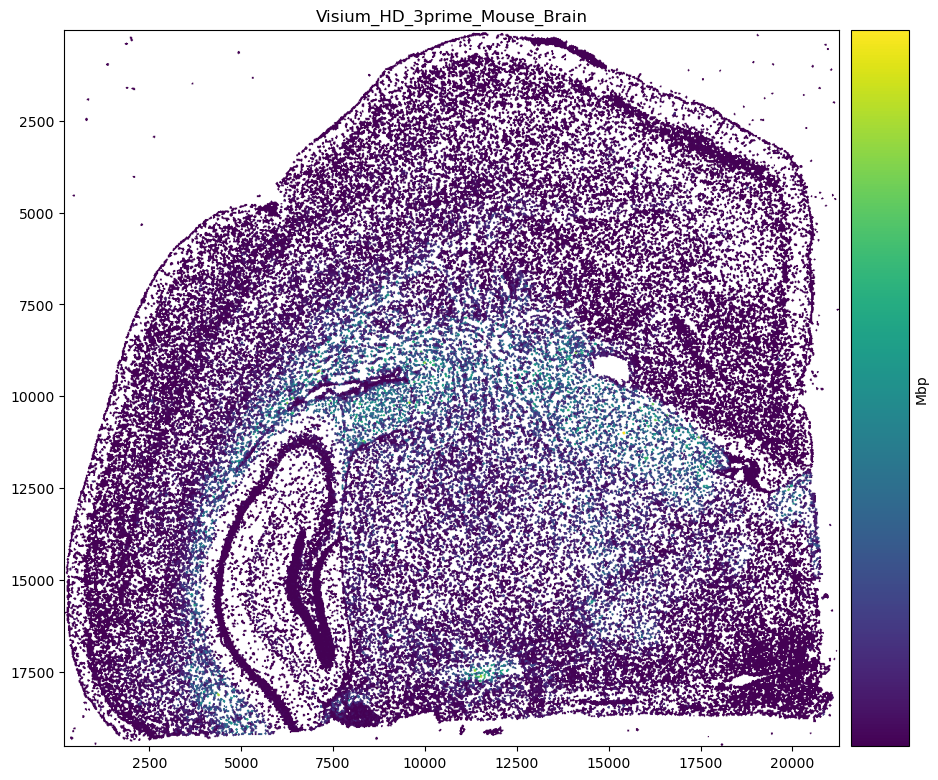

CPU times: user 8.16 s, sys: 777 ms, total: 8.93 s
Wall time: 7.76 s


In [62]:
%%time
plt.figure(figsize=(10, 10))
ax = plt.gca()

gene_name = "Mbp"
sdata_visium_hd.pl.render_shapes(
    shapes_key,
    color=gene_name, method="datashader"
).pl.show(
    coordinate_systems=cs, ax=ax
)
plt.xticks([])
plt.yticks([])
plt.show()

## A Few Words on Rasterization

You might have noticed that rendering the image takes a lot longer than it used to with the Visium data from the previous sections. SpatialData provides functions for the rasterization of shapes in a SpatialData object to speed up plotting this large data. Here just a few words on rasterization in the context of Visium HD data.

Visium HD data are generated at extremely high spatial resolution and can be represented either as many small spatial bins (polygons or points) or as a dense pixel-like grid. When visualizing binned Visium HD expression data, rasterization is often used to convert these bins into an image where each pixel (or block of pixels) represents the expression values of a bin.

In SpatialData, rasterization means explicitly converting vector-based spatial objects (such as Visium HD bins or cell segmentation polygons) into a pixel-based representation stored as a separate raster image. This creates a new data object with a fixed resolution.
This is fundamentally different from rasterization performed by plotting libraries such as Matplotlib, where vector objects are rasterized only temporarily to draw them on screen. Plotting rasterization does not change how the data are stored.
In Visium HD workflows, rasterization is often used to create rasterized views of dense binned expression data for efficient visualization, while keeping the original polygon-based data for geometric and cell-level analyses.

For more information, check out the [the SpatialData documentation](https://spatialdata.scverse.org/en/latest/tutorials/notebooks/notebooks/examples/labels_shapes_interchangeability.html).

Here, we will only be working with the polygons attained from cell segmentation as they give us the highest accuracy for biological interpretation.

Since the data is still huge, we will work on just a crop of the data mainly.

In [63]:
from spatialdata import bounding_box_query

min_x=4000
min_y=13000
max_x=10000
max_y=18000

def crop(x, min_x=4000, min_y=13000, max_x=10000, max_y=18000):
    return bounding_box_query(
        x,
        min_coordinate=[min_x, min_y],
        max_coordinate=[max_x, max_y],
        axes=("x", "y"),
        target_coordinate_system=cs,
    )

INFO     Rasterizing image for faster rendering.                                                                   


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.012..1.0].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.016129032..1.0].


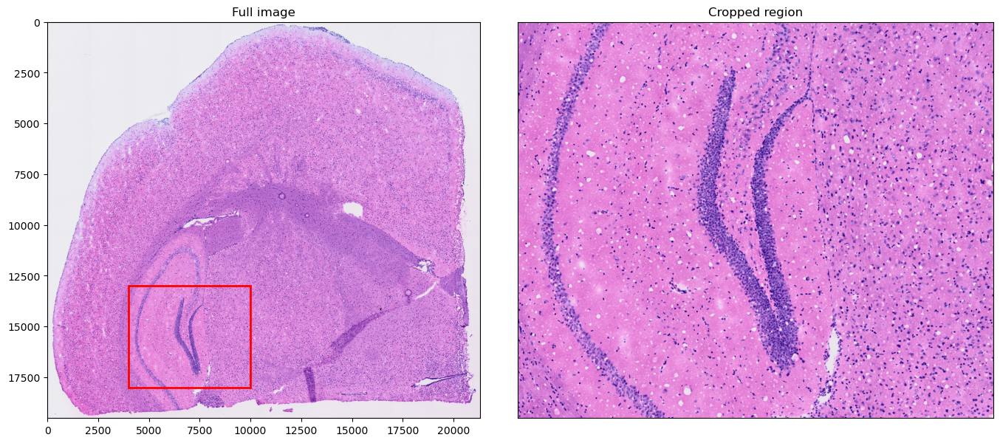

In [64]:
from matplotlib.patches import Rectangle

sdata_crop = crop(sdata_visium_hd)

fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Full image
sdata_visium_hd.pl.render_images(img_key).pl.show(
    ax=axes[0],
    coordinate_systems=cs,
    title="Full image",
)

# Draw bounding box
rect = Rectangle(
    (min_x, min_y),
    max_x - min_x,
    max_y - min_y,
    linewidth=2,
    edgecolor="red",
    facecolor="none",
)
axes[0].add_patch(rect)

# Cropped image
sdata_crop.pl.render_images(img_key).pl.show(
    ax=axes[1],
    coordinate_systems=cs,
    title="Cropped region",
)

plt.xticks([])
plt.yticks([])
plt.tight_layout()
plt.show()

In [65]:
sdata_crop[seg_table].var_names

Index(['Xkr4', 'Gm1992', 'Gm19938', 'Gm37381', 'Rp1', 'Sox17', 'Gm37587',
       'Gm37323', 'Mrpl15', 'A930006A01Rik',
       ...
       'Gm16367', 'ENSMUSG00000094172', 'ENSMUSG00000094887',
       'ENSMUSG00000091585', 'ENSMUSG00000095763', 'ENSMUSG00000095523',
       'ENSMUSG00000095475', 'ENSMUSG00000094855', 'ENSMUSG00000095019',
       'ENSMUSG00000095041'],
      dtype='object', length=33696)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.016129032..1.0].


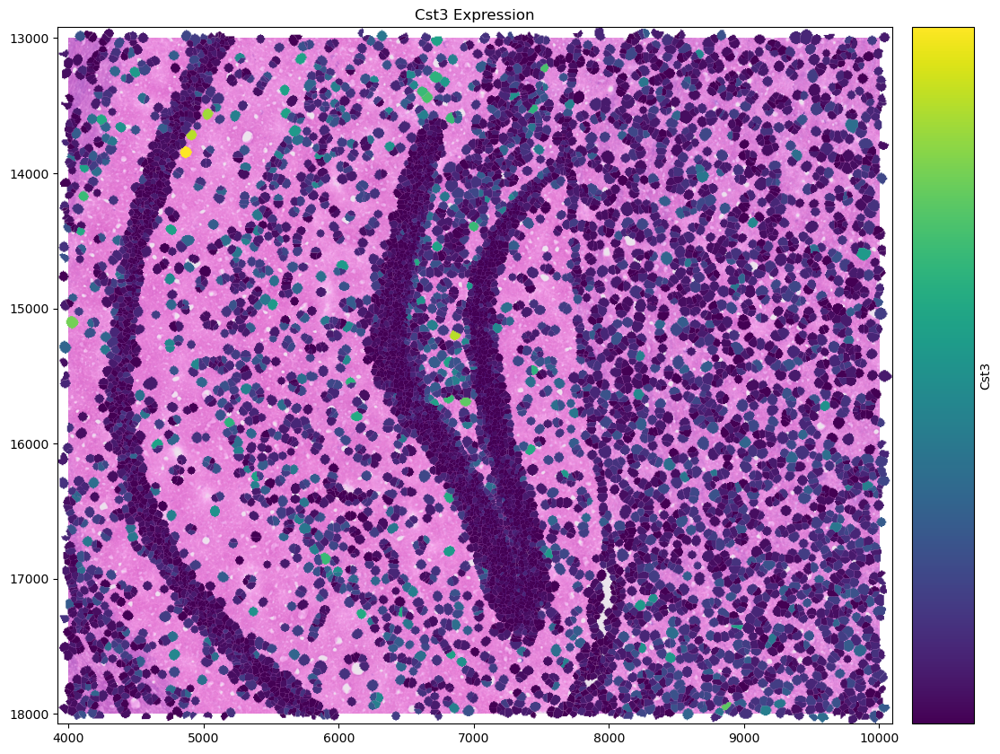

CPU times: user 8.06 s, sys: 578 ms, total: 8.64 s
Wall time: 8.64 s


In [66]:
%%time
gene_name = "Cst3"
sdata_crop.pl.render_images(img_key).pl.render_shapes(
    shapes_key, color=gene_name
).pl.show(coordinate_systems=cs, title=f"{gene_name} Expression", figsize=(10, 10))
plt.xticks([])
plt.yticks([])
plt.show()

In [67]:
import pandas as pd

# For convenience we rehost the single file containing the clusters we are interested in.
clusters_file = "/home/jovyan/shared/day-03/data/visium_hd_mouse_brain/segmented_outputs/analysis/clustering/gene_expression_graphclust/clusters.csv"
df = pd.read_csv(clusters_file)

In [68]:
df.head(3)

,Barcode,Cluster
0,cellid_000000001-1,22
1,cellid_000000002-1,22
2,cellid_000000003-1,22


In [69]:
# let's convert the Cluster dtype from int64 to categorical since later we want the plots to use a categorical colormap
df["Cluster"] = df["Cluster"].astype("category")
df.set_index("Barcode", inplace=True)

Let’s merge the data.

In [70]:
sdata_crop[seg_table].obs["Cluster"] = df["Cluster"]

Let’s plot the clusters on the cropped data we used before.

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.016129032..1.0].
/opt/conda/envs/p10_qc_normalization/lib/python3.12/site-packages/spatialdata_plot/pl/utils.py:1123: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = color_source_vector.map(color_mapping)


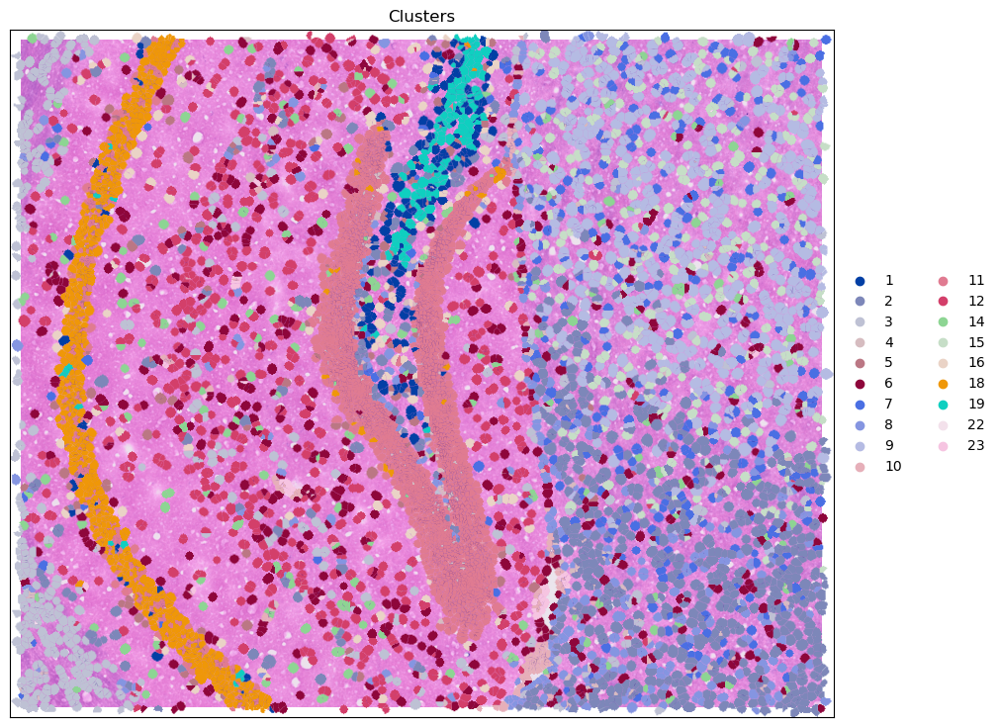

CPU times: user 8 s, sys: 603 ms, total: 8.6 s
Wall time: 8.61 s


In [71]:
%%time
sdata_crop.pl.render_images(img_key).pl.render_shapes(
    shapes_key, color="Cluster"
).pl.show(coordinate_systems=cs, title=f"Clusters", figsize=(10, 10))
plt.xticks([])
plt.yticks([])
plt.show()

## QC

In [72]:
# Check initial dimensions
print(f"Initial dataset dimensions: {sdata_crop[seg_table].shape}")

Initial dataset dimensions: (8567, 33696)


### 1. Mito-tracking

From this point, the QC steps don't differ drastically from the QC performed on Visium v1 and v2 data, except that we are dealing with single-cell resolution data here, which changes cut-offs accordingly, as well as available metrics for QC (e.g. cell size and cell type).

In [73]:
# Check the first 20 gene names in the dataset
print("First 20 gene names in the dataset:")
print(sdata_crop[seg_table].var.index[:20].tolist())

# Detect mitochondrial genes using prefixes (MT-, mt-, mt\-, etc.)
mito_genes_alt = sdata_crop[seg_table].var.index.str.contains(r"(^MT-)|(^mt-)|(^mt\\-)", regex=True)
print(f"Number of mitochondrial genes detected: {mito_genes_alt.sum()}")

# Extract and print the mitochondrial gene names
mito_genes_list = sdata_crop[seg_table].var.index[mito_genes_alt]
print("Mitochondrial genes detected:")
print(mito_genes_list.tolist())

First 20 gene names in the dataset:
['Xkr4', 'Gm1992', 'Gm19938', 'Gm37381', 'Rp1', 'Sox17', 'Gm37587', 'Gm37323', 'Mrpl15', 'A930006A01Rik', 'Lypla1', 'Tcea1', 'Rgs20', 'Gm16041', 'Atp6v1h', 'Oprk1', 'Npbwr1', '4732440D04Rik', 'Rb1cc1', 'Alkal1']
Number of mitochondrial genes detected: 13
Mitochondrial genes detected:
['mt-Nd1', 'mt-Nd2', 'mt-Co1', 'mt-Co2', 'mt-Atp8', 'mt-Atp6', 'mt-Co3', 'mt-Nd3', 'mt-Nd4l', 'mt-Nd4', 'mt-Nd5', 'mt-Nd6', 'mt-Cytb']


/tmp/ipykernel_86/3790562899.py:6: UserWarning: This pattern is interpreted as a regular expression, and has match groups. To actually get the groups, use str.extract.
  mito_genes_alt = sdata_crop[seg_table].var.index.str.contains(r"(^MT-)|(^mt-)|(^mt\\-)", regex=True)


In [74]:
# Mark mitochondrial genes in the var DataFrame
sdata_crop[seg_table].var['mt'] = mito_genes_alt

# Calculate per-spot QC metrics
from scanpy.preprocessing import calculate_qc_metrics
calculate_qc_metrics(
    sdata_crop[seg_table], 
    qc_vars=['mt'],  # Use the 'mt' column to flag mitochondrial genes
    percent_top=None, 
    log1p=False, 
    inplace=True
)

# Display mitochondrial metrics
print("Mitochondrial QC metrics:")
print(sdata_crop[seg_table].obs[['pct_counts_mt', 'total_counts', 'n_genes_by_counts']].head())

Mitochondrial QC metrics:
                    pct_counts_mt  total_counts  n_genes_by_counts
cellid_000035153-1       9.722222         360.0                300
cellid_000037724-1      28.934011         394.0                257
cellid_000037725-1      27.819550         399.0                263
cellid_000037732-1      11.940298          67.0                 55
cellid_000037749-1       2.566735         974.0                756


/tmp/ipykernel_86/3026571764.py:6: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  plt.legend()


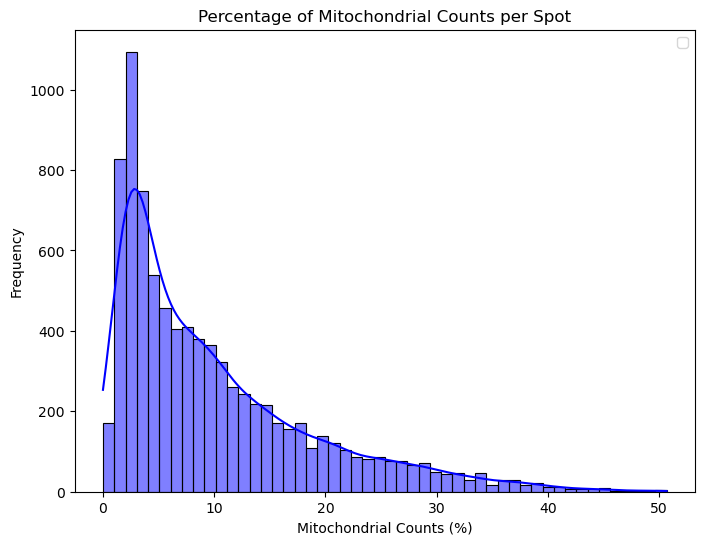

In [84]:
plt.figure(figsize=(8, 6))
sns.histplot(sdata_crop[seg_table].obs["pct_counts_mt"], kde=True, bins=50, color='blue')
plt.title("Percentage of Mitochondrial Counts per Spot")
plt.xlabel("Mitochondrial Counts (%)")
plt.ylabel("Frequency")
plt.legend()
plt.show()

### 2. Total counts

In [76]:
# List all available elements in the SpatialData object
print(sdata_crop)

print("Columns in obs:")
print(sdata_crop[seg_table].obs.columns)

SpatialData object
├── Images
│     ├── 'Visium_HD_3prime_Mouse_Brain_hires_image': DataArray[cyx] (3, 1407, 1689)
│     └── 'Visium_HD_3prime_Mouse_Brain_lowres_image': DataArray[cyx] (3, 141, 168)
├── Shapes
│     └── 'Visium_HD_3prime_Mouse_Brain_cell_segmentations': GeoDataFrame shape: (8567, 2) (2D shapes)
└── Tables
      └── 'cell_segmentations': AnnData (8567, 33696)
with coordinate systems:
    ▸ 'Visium_HD_3prime_Mouse_Brain', with elements:
        Visium_HD_3prime_Mouse_Brain_hires_image (Images), Visium_HD_3prime_Mouse_Brain_lowres_image (Images), Visium_HD_3prime_Mouse_Brain_cell_segmentations (Shapes)
    ▸ 'Visium_HD_3prime_Mouse_Brain_downscaled_hires', with elements:
        Visium_HD_3prime_Mouse_Brain_hires_image (Images), Visium_HD_3prime_Mouse_Brain_cell_segmentations (Shapes)
    ▸ 'Visium_HD_3prime_Mouse_Brain_downscaled_lowres', with elements:
        Visium_HD_3prime_Mouse_Brain_lowres_image (Images), Visium_HD_3prime_Mouse_Brain_cell_segmentations (Shapes)
Co

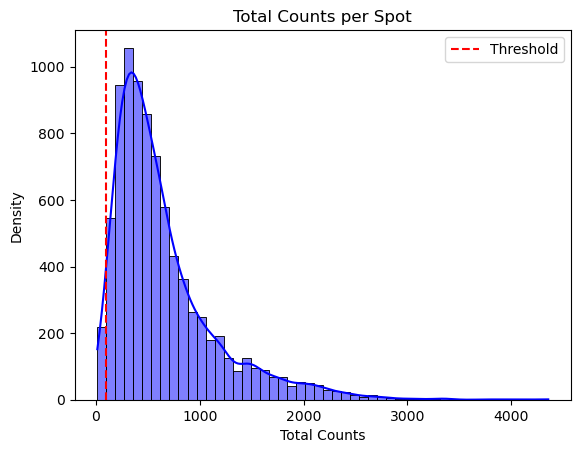

In [77]:
# Access the 'total_counts' column from the appropriate table
total_counts = sdata_crop[seg_table].obs['total_counts']

# Define a threshold for low library size (adjust as necessary)
low_library_size_threshold = 100  # Example threshold

# Plot the histogram
sns.histplot(total_counts, kde=True, bins=50, color='blue')
plt.axvline(low_library_size_threshold, color='red', linestyle='--', label='Threshold')
plt.title('Total Counts per Spot')
plt.xlabel('Total Counts')
plt.ylabel('Density')
plt.legend()
plt.show()

In [78]:
# Check the number of spots below a certain threshold
low_library_spots = total_counts[total_counts < low_library_size_threshold]
print(f"Number of spots below the threshold of {low_library_size_threshold}: {len(low_library_spots)}")

print("Example spots with low total counts:")
print(low_library_spots.head())

Number of spots below the threshold of 100: 213
Example spots with low total counts:
cellid_000037732-1    67.0
cellid_000038283-1    72.0
cellid_000038485-1    70.0
cellid_000039104-1    79.0
cellid_000039365-1    95.0
Name: total_counts, dtype: float32


### 3. Genes

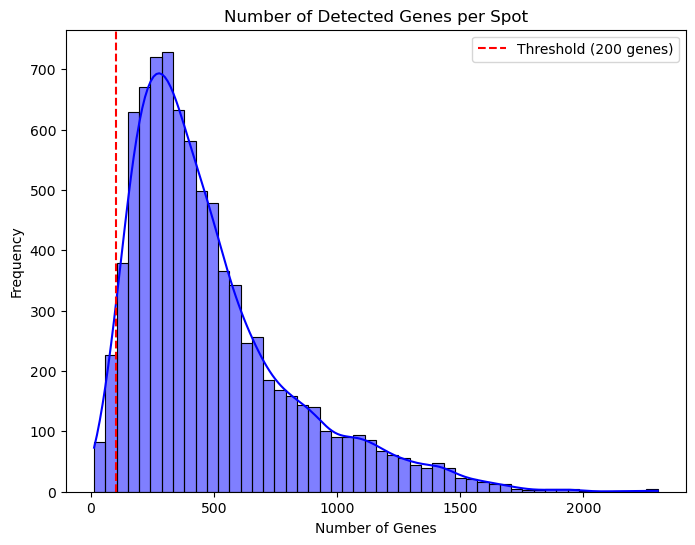

In [82]:
plt.figure(figsize=(8, 6))
sns.histplot(sdata_crop[seg_table].obs["n_genes_by_counts"], kde=True, bins=50, color='blue')
plt.title("Number of Detected Genes per Spot")
plt.xlabel("Number of Genes")
plt.ylabel("Frequency")
plt.axvline(100, color="red", linestyle="--", label="Threshold (200 genes)")
plt.legend()
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.016129032..1.0].


INFO     Using 'datashader' backend with 'sum' as reduction method to speed up plotting. Depending on the reduction
         method, the value range of the plot might change. Set method to 'matplotlib' to disable this behaviour.   
INFO     Using the datashader reduction "sum". "max" will give an output very close to the matplotlib result.      


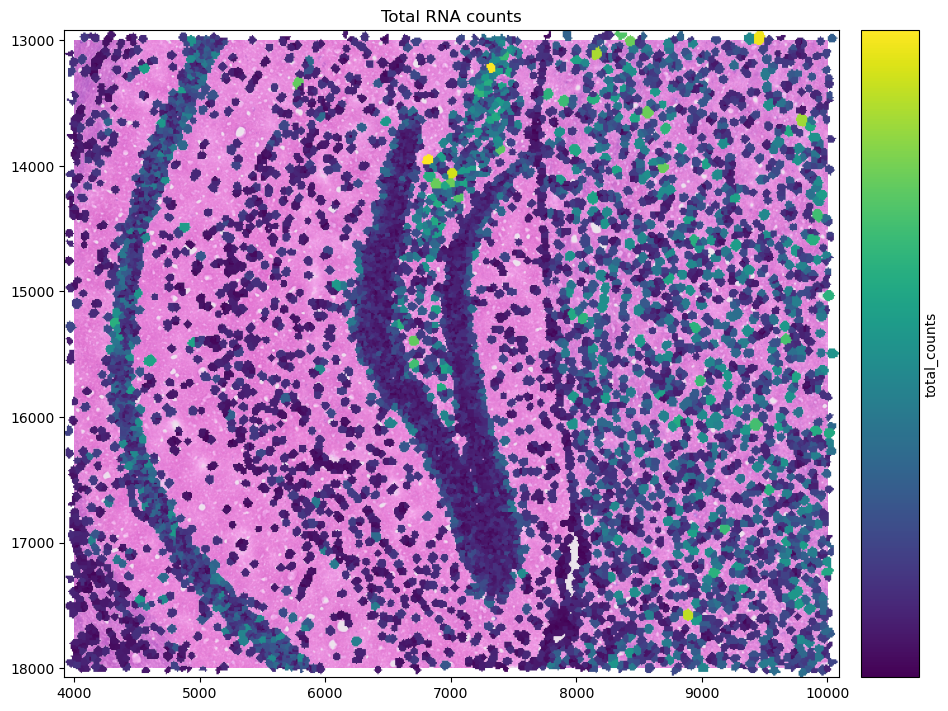

CPU times: user 8.34 s, sys: 1 s, total: 9.34 s
Wall time: 8.86 s


In [80]:
%%time

# Create a figure for the plot
plt.figure(figsize=(10, 10))
ax = plt.gca()

sdata_crop.pl.render_images(img_key).pl.render_shapes(
    shapes_key, color="total_counts", method="datashader"
).pl.show(coordinate_systems=cs, title=f"Total RNA counts", ax=ax)
plt.xticks([])
plt.yticks([])
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.016129032..1.0].


INFO     Using 'datashader' backend with 'sum' as reduction method to speed up plotting. Depending on the reduction
         method, the value range of the plot might change. Set method to 'matplotlib' to disable this behaviour.   
INFO     Using the datashader reduction "sum". "max" will give an output very close to the matplotlib result.      


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.016129032..1.0].


INFO     Using 'datashader' backend with 'sum' as reduction method to speed up plotting. Depending on the reduction
         method, the value range of the plot might change. Set method to 'matplotlib' to disable this behaviour.   
INFO     Using the datashader reduction "sum". "max" will give an output very close to the matplotlib result.      


Text(0.5, 1.0, 'Percentage of Mitochondrial Reads')

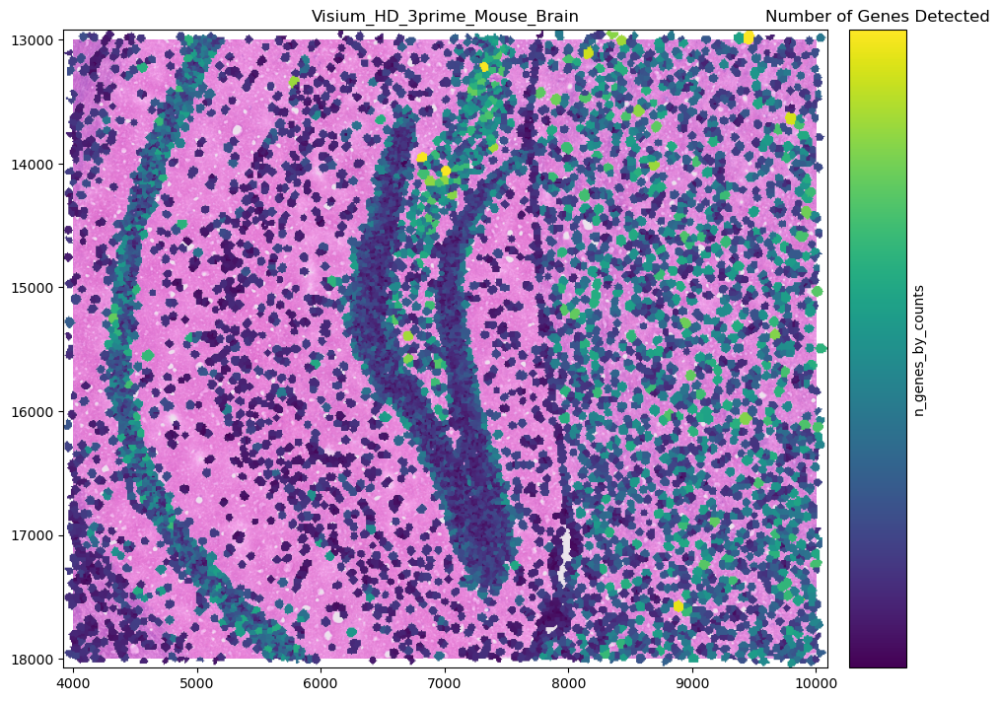

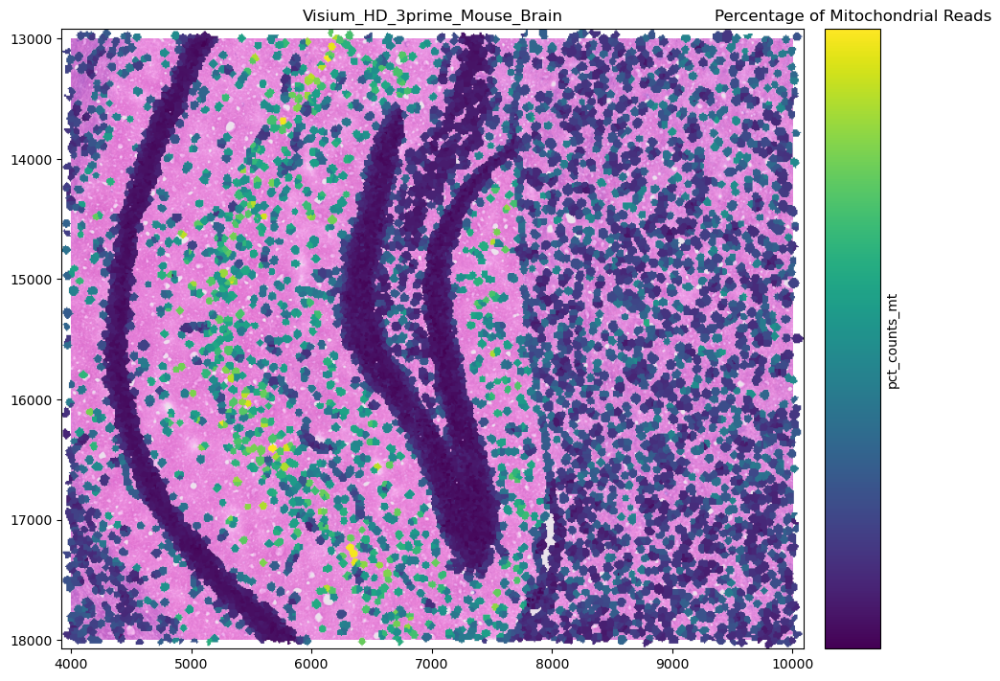

In [81]:
# Plot number of genes detected (n_genes_by_counts)
plt.figure(figsize=(10, 10))
ax = plt.gca()
sdata_crop.pl.render_images(img_key).pl.render_shapes(
    shapes_key,
    color="n_genes_by_counts",  # Column for number of genes detected
    method="datashader"
).pl.show(
    coordinate_systems=cs,
    ax=ax
)
plt.title("Number of Genes Detected")
plt.xticks([])
plt.yticks([])

# Plot mitochondrial content (pct_counts_mt)
plt.figure(figsize=(10, 10))
ax = plt.gca()
sdata_crop.pl.render_images(img_key).pl.render_shapes(
    shapes_key,
    color="pct_counts_mt",  # Column for mitochondrial content
    method="datashader"
).pl.show(
    coordinate_systems=cs,
    ax=ax
)
plt.xticks([])
plt.yticks([])
plt.title("Percentage of Mitochondrial Reads")

The remaining QC steps are very similar to how QC is performed for image-based ST, which is going to be covered in the next practical, so we will leave it at this point. Normalization by cell volume and cell density would be steps that can be performed on Visium HD data as well if a cell segmentation is available.